In [3]:
from astroquery.sdss import SDSS
import astropy.units as u
from astropy.io import fits
import matplotlib.pyplot as plt
import math
import numpy as np
from specutils import Spectrum
from specutils.fitting import fit_generic_continuum
from specutils.manipulation import LinearInterpolatedResampler
from labellines import labelLines
import matplotlib.axes as axes
from scipy.optimize import curve_fit
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, mark_inset
import scipy
from PIL import Image
from fpdf import FPDF
import random

In [4]:
eboss_fits = fits.open('eboss_dr17_summary_edapv10_cigale.fit', memmap=True)

eboss_data = eboss_fits[1].data
eboss_fits.info()
print(eboss_fits[1].columns)

Filename: eboss_dr17_summary_edapv10_cigale.fit
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1                1 BinTableHDU    235   1898753R x 109C   ['J', 'J', 'J', '16A', 'D', 'E', 'D', 'D', 'E', '118A', '4A', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', '9A', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', '8E', '8E', '8E', '8E', '5E', '5E', '5E', '5E', 'E', 'E', 'A', 'A', 'A', 'I', 'I', 'I']   
ColDefs(
    name = 'PLATE'; format = 'J'
    name = 'MJD'; format = 'J'
    name = 'FIBER'; format = 'J'
    name = 'PMF_STRING'; format = '16A'
    name = 'Z'; format = 'D'
    name = 'Z_ERR'; format = 'E'
    nam

In [9]:
# Remove possible +/- inf values
gals_flux = eboss_data[(eboss_data['NII_6584_FLUX_ERR']>0)]

err_range = 3

# Make sure relavent emission lines have well measured fluxes
quality_gals = gals_flux[((gals_flux['H_ALPHA_FLUX']/gals_flux['H_ALPHA_FLUX_ERR'])>err_range) &
                (((gals_flux['NII_6584_FLUX']/gals_flux['NII_6584_FLUX_ERR'])>err_range) | (gals_flux["H_GAMMA_EW"]>10)) & 
                (gals_flux['Z']<0.15)] #signal to noise ratio filter

cut_gals = quality_gals[(np.log10(quality_gals['NII_6584_FLUX']/quality_gals['H_ALPHA_FLUX'])<(-1.5))]

print(len(cut_gals))

gals_sf = cut_gals[cut_gals['SFG']==1]
gals_agn = cut_gals[cut_gals['AGN']==1]

1286


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\3052148939.py:11: RuntimeWarning: divide by zero encountered in log10
  cut_gals = quality_gals[(np.log10(quality_gals['NII_6584_FLUX']/quality_gals['H_ALPHA_FLUX'])<(-1.5))]


In [10]:
random_galaxies = random.sample(range(1, len(cut_gals)), 100)
random_galaxies.sort()
print(random_galaxies)
random_galaxies = [4, 8, 15, 18, 23, 32, 34, 51, 55, 62, 70, 71, 72, 91, 95, 100, 115, 121, 127, 137, 153, 158, 168, 175, 183, 219, 220, 224, 230, 234, 241, 257, 265, 271, 274, 277, 283, 287, 313, 336, 342, 384, 430, 442, 500, 502, 505, 511, 521, 533, 534, 550, 565, 566, 567, 568, 571, 611, 618, 656, 662, 667, 673, 710, 711, 750, 764, 772, 791, 796, 808, 819, 824, 837, 838, 843, 852, 854, 861, 862, 869, 875, 876, 913, 919, 922, 924, 970, 976, 987, 990, 1037, 1104, 1177, 1201, 1207, 1221, 1226, 1234, 1258]

[2, 17, 29, 34, 48, 49, 69, 80, 106, 130, 141, 165, 194, 202, 214, 220, 244, 293, 306, 316, 322, 330, 336, 348, 402, 415, 424, 426, 436, 443, 446, 469, 475, 482, 485, 496, 499, 503, 508, 568, 600, 621, 623, 638, 665, 682, 700, 712, 718, 719, 722, 735, 741, 748, 762, 766, 773, 797, 813, 836, 839, 883, 891, 903, 910, 912, 915, 923, 928, 929, 948, 952, 954, 960, 973, 976, 988, 989, 1013, 1015, 1021, 1037, 1040, 1053, 1080, 1100, 1108, 1115, 1124, 1161, 1163, 1198, 1214, 1226, 1229, 1237, 1256, 1265, 1280, 1283]


In [11]:
def hex_to_rgb(hex_color):
    """Converts a hex color code to an RGB tuple.

    Args:
        hex_color: A string representing the hex color code (e.g., "#FF0000").

    Returns:
        A tuple of three integers representing the RGB values (e.g., (255, 0, 0)).
    """
    hex_color = hex_color.lstrip("#")  # Remove the '#' if present
    return tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))

def get_color_gradient(c1, c2, n):
    """
    Given two hex colors, returns a color gradient
    with n colors.
    """
    assert n > 1
    c1_rgb = np.array(hex_to_rgb(c1))/255
    c2_rgb = np.array(hex_to_rgb(c2))/255
    mix_pcts = [x/(n-1) for x in range(n)]
    rgb_colors = [((1-mix)*c1_rgb + (mix*c2_rgb)) for mix in mix_pcts]
    return ["#" + "".join([format(int(round(val*255)), "02x") for val in item]) for item in rgb_colors]

0
3615-56544-100


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


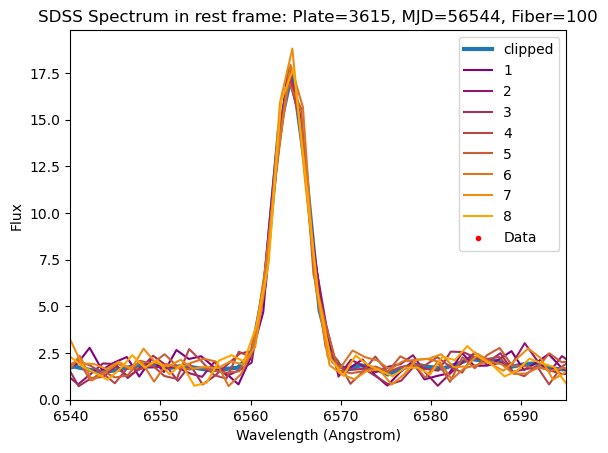

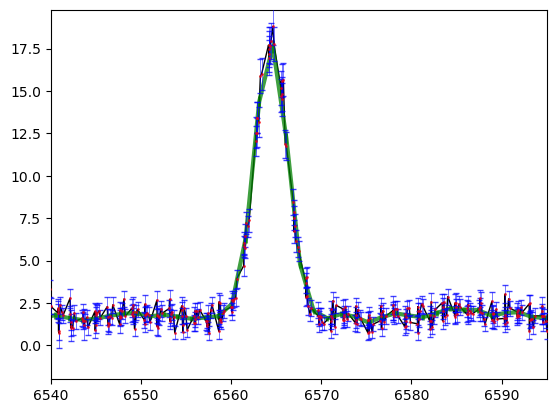

1
3657-55244-4


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


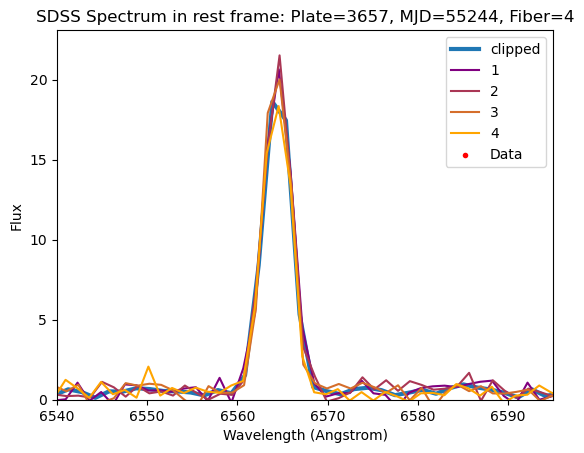

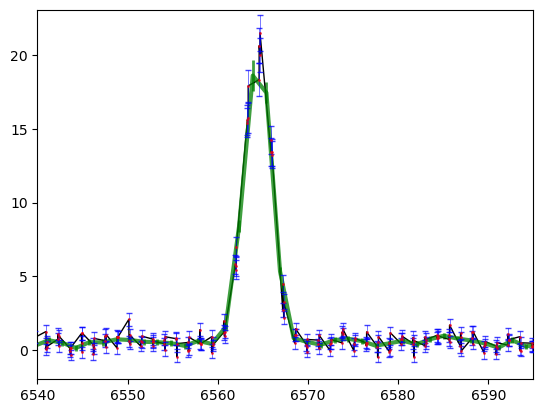

2
3670-55480-196


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


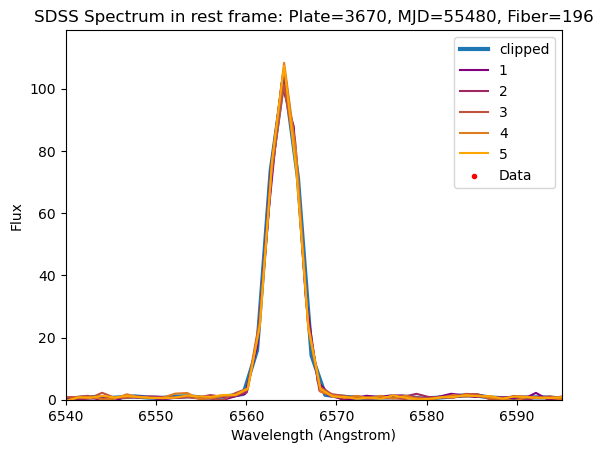

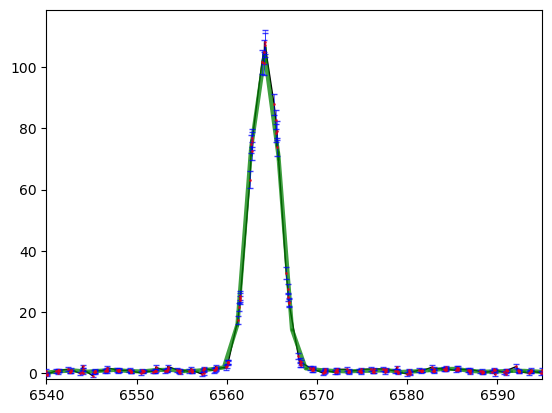

3
3691-55274-169


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


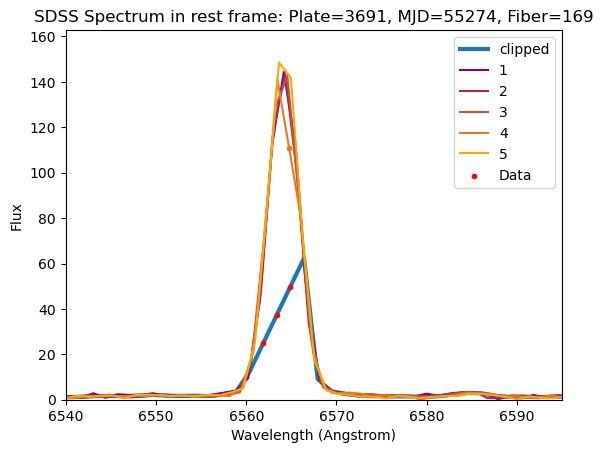

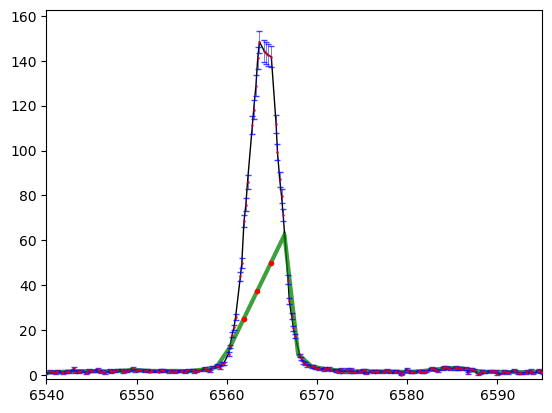

4
3744-55209-368


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


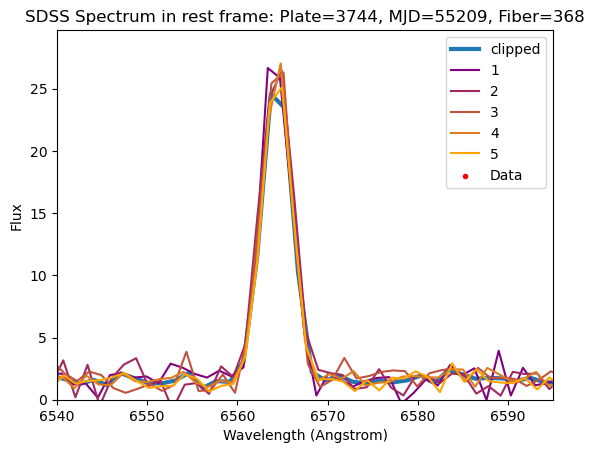

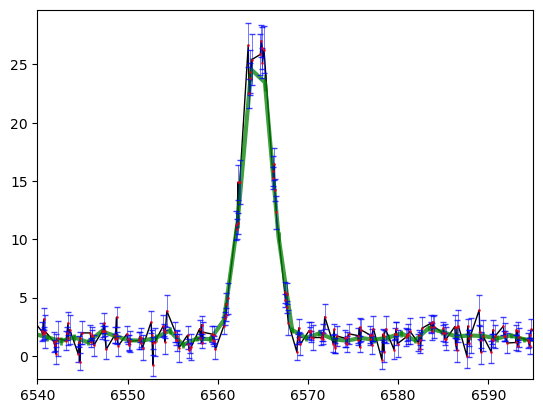

5
3771-55544-642


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


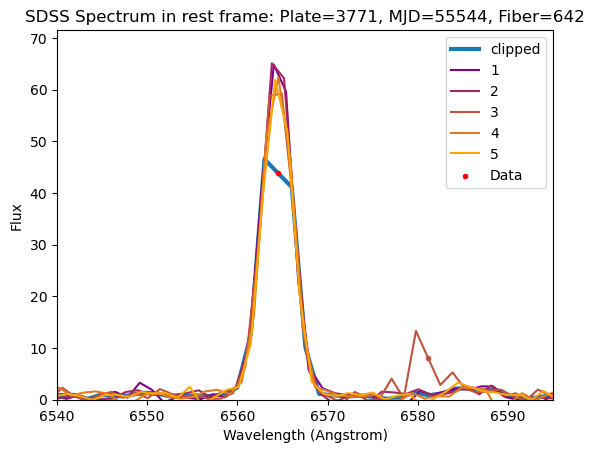

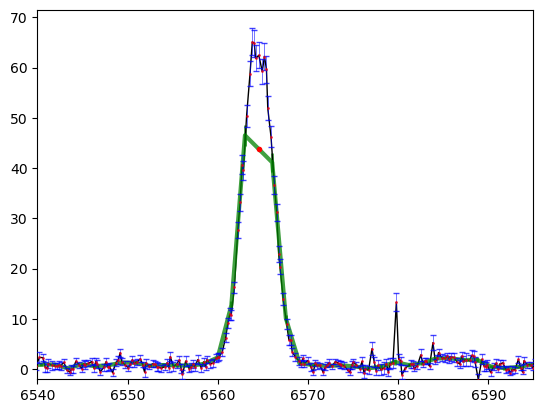

6
3772-55277-36


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


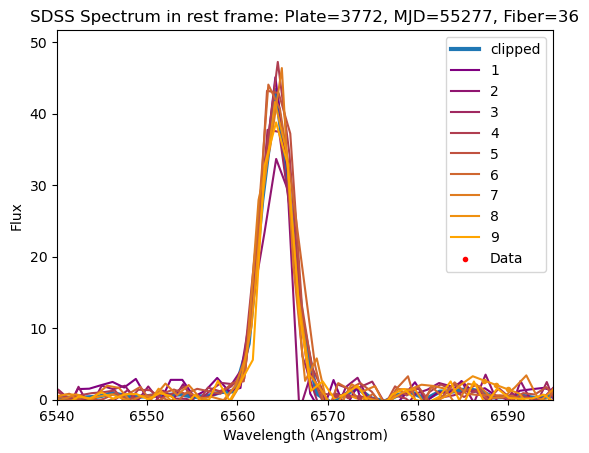

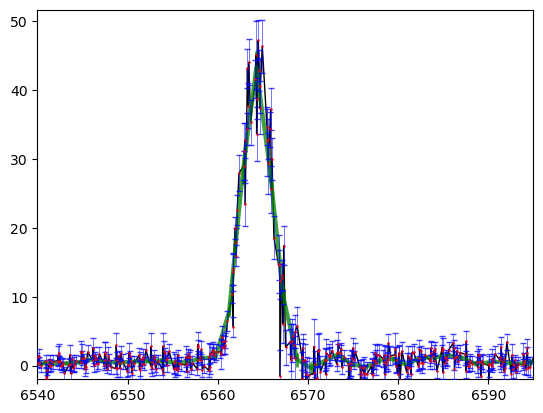

7
3837-55572-639


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


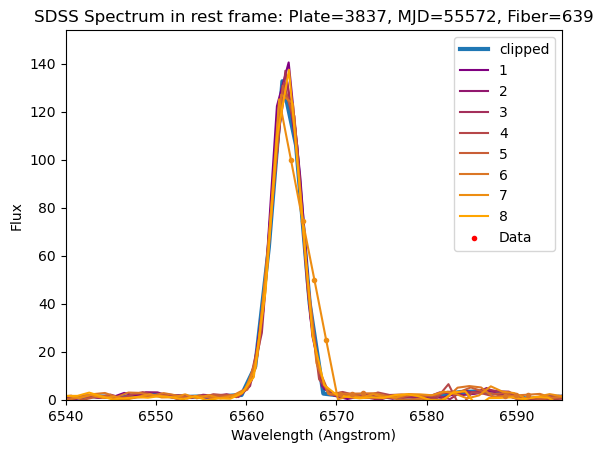

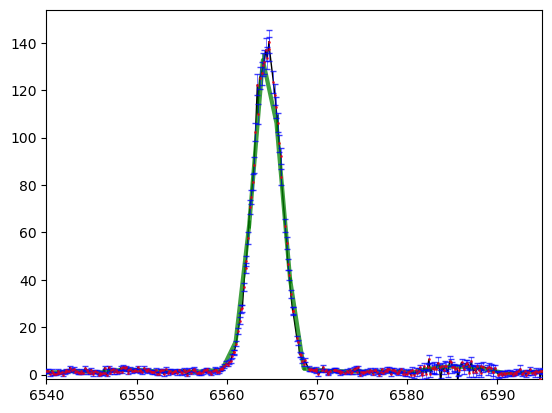

8
3854-55247-366


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


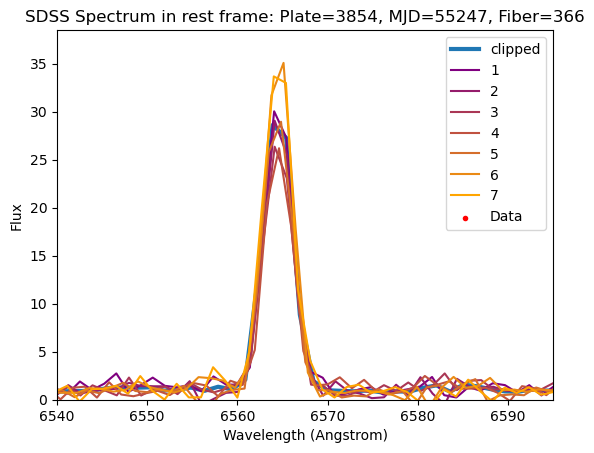

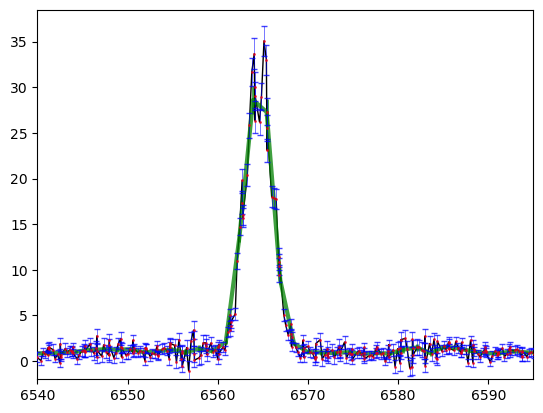

9
3874-55280-437


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


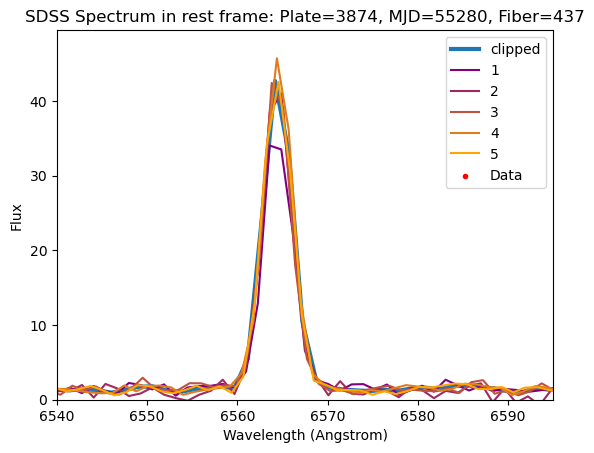

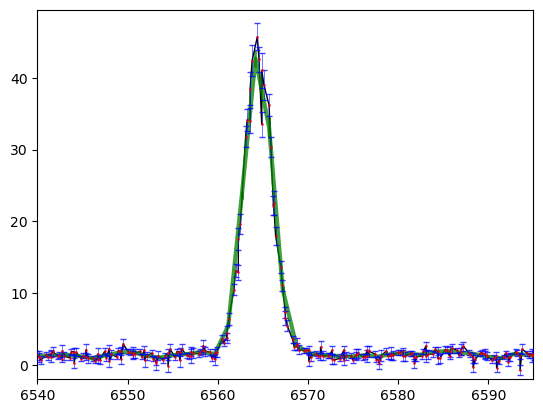

10
3951-55681-136


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


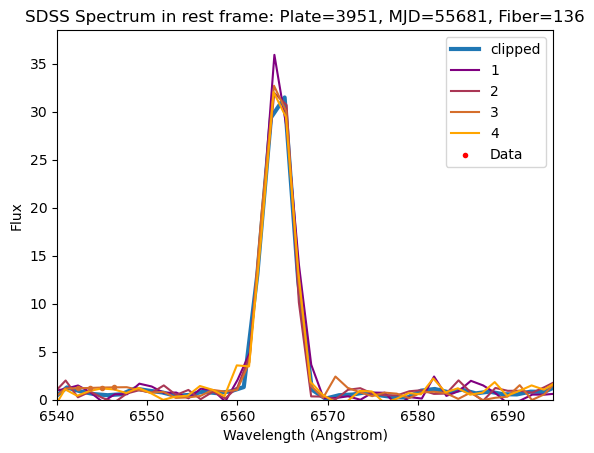

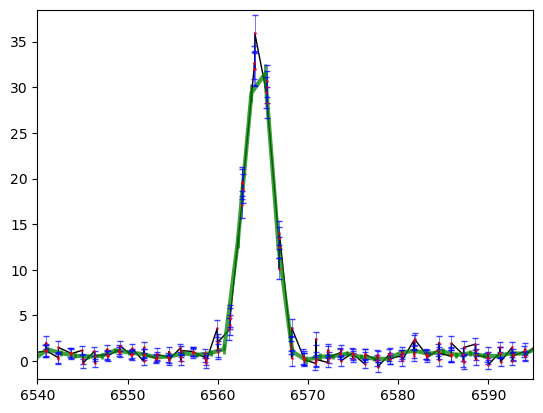

11
3954-55680-189


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


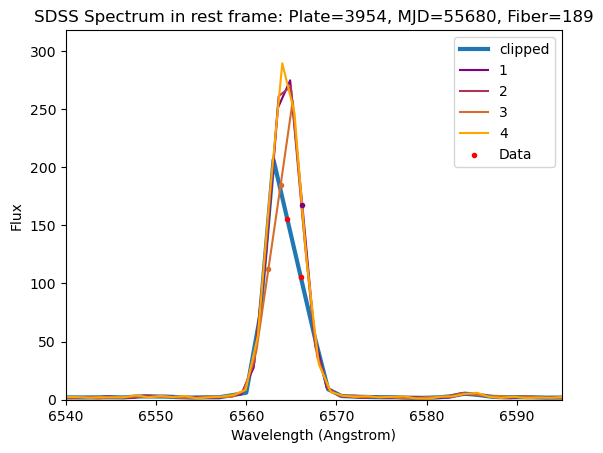

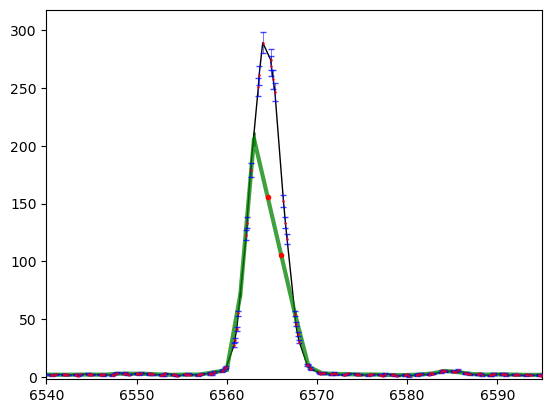

12
3954-55680-268


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


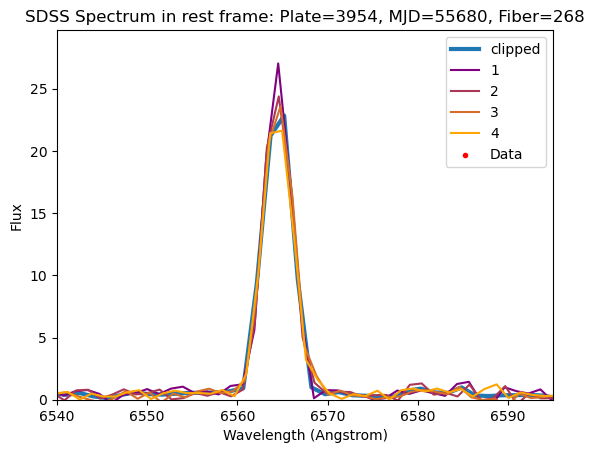

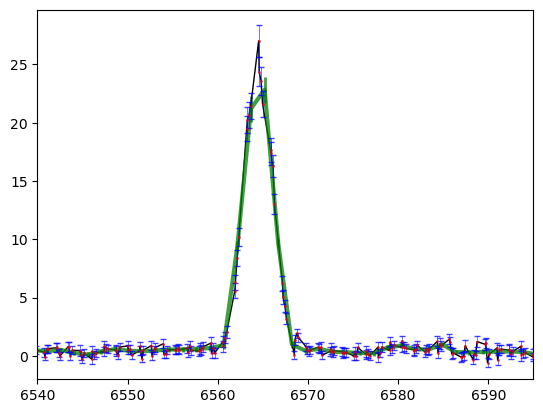

13
4092-55477-446


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


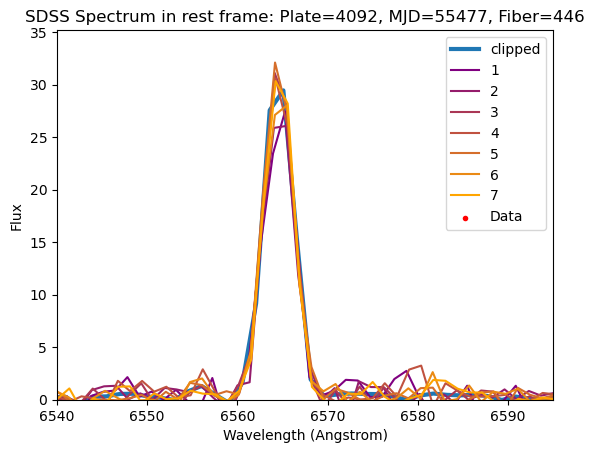

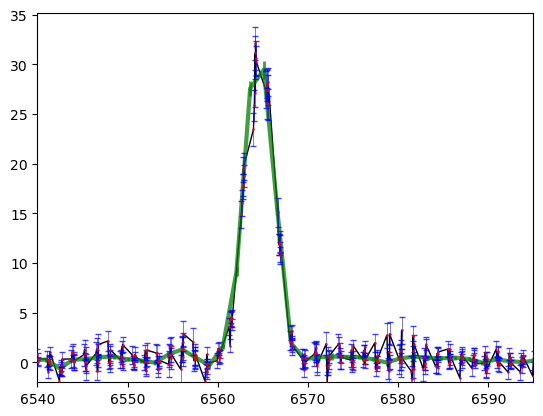

14
4174-55659-410


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


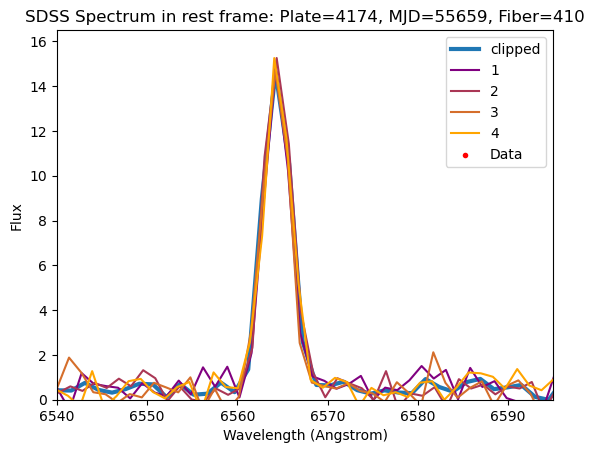

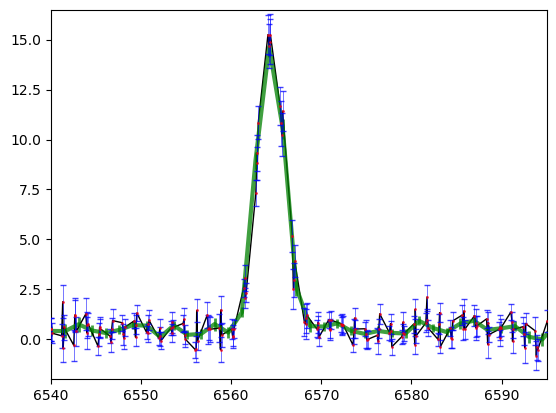

15
4182-55446-204


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


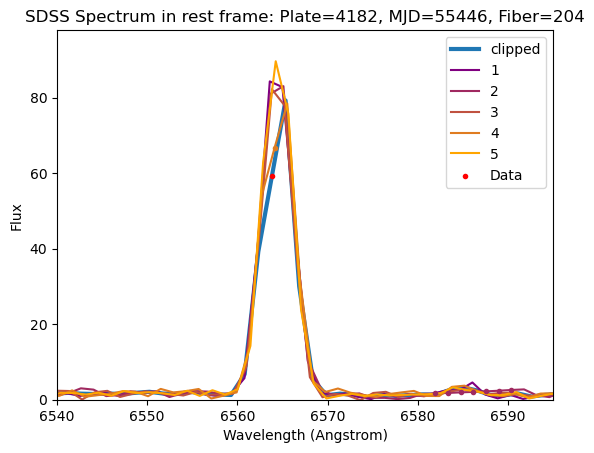

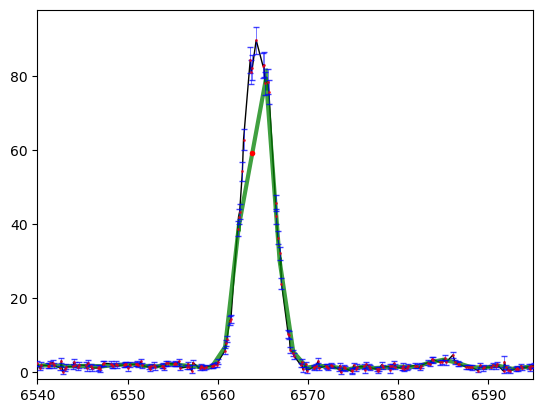

16
4228-55484-840


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


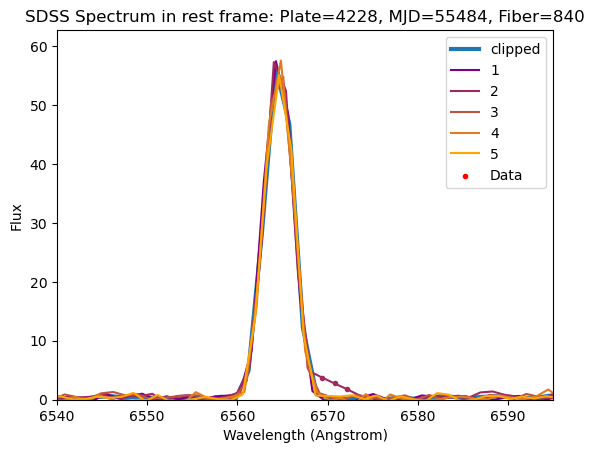

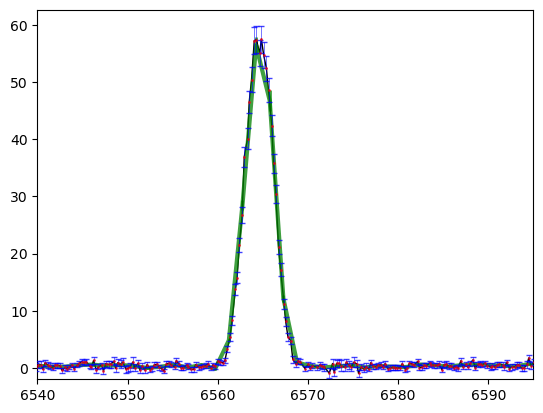

17
4256-55477-284


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


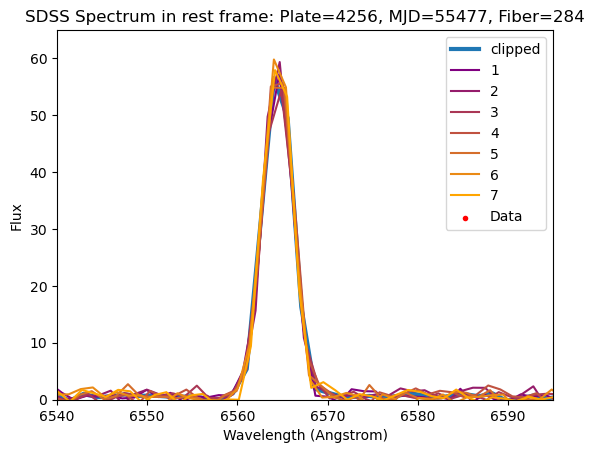

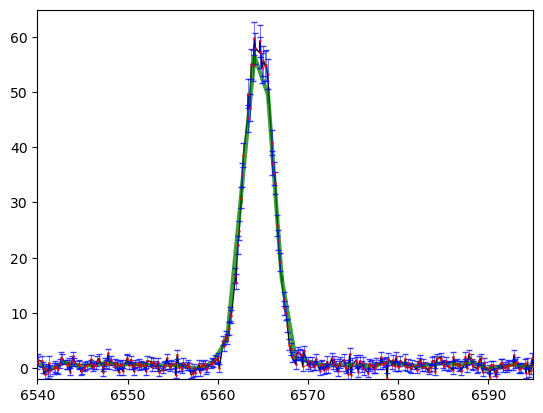

18
4269-55502-464


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


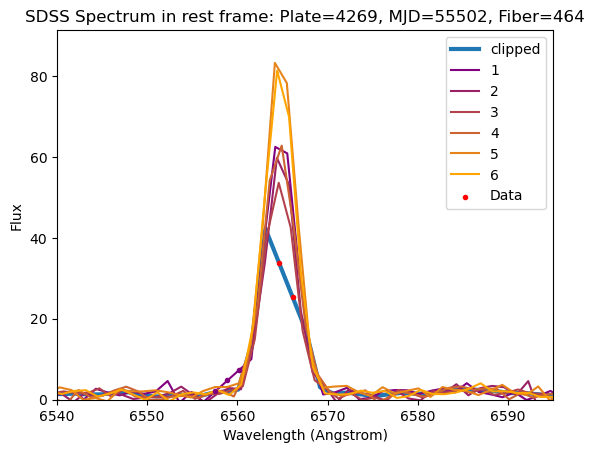

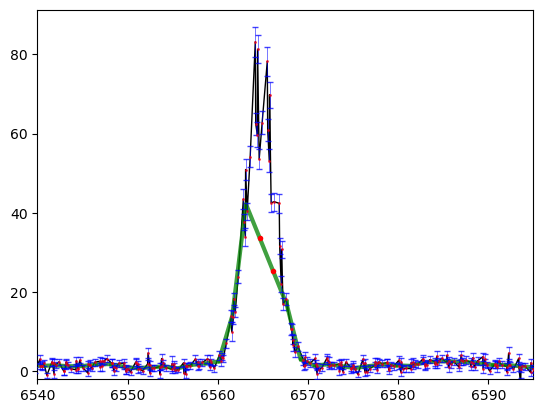

19
4297-55806-323


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


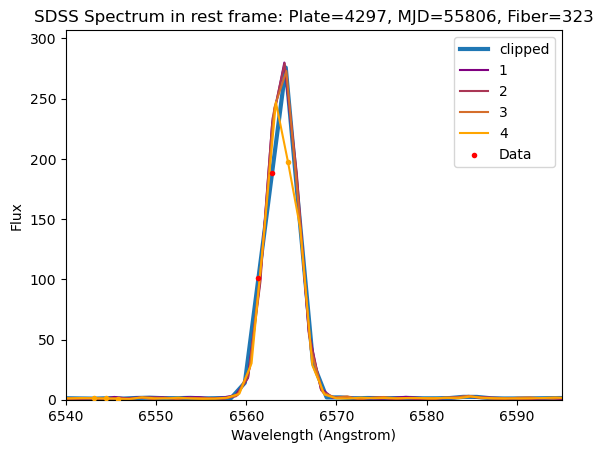

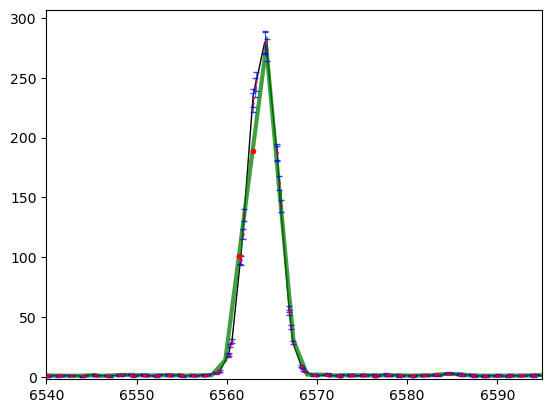

20
4382-55742-798


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


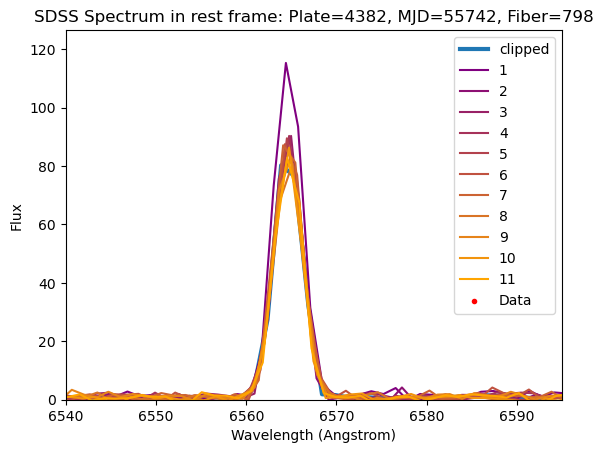

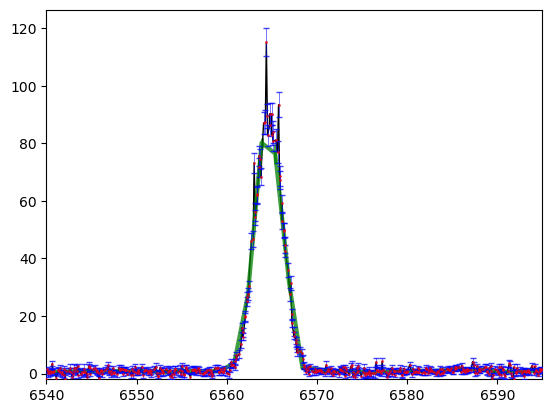

21
4391-55866-290


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


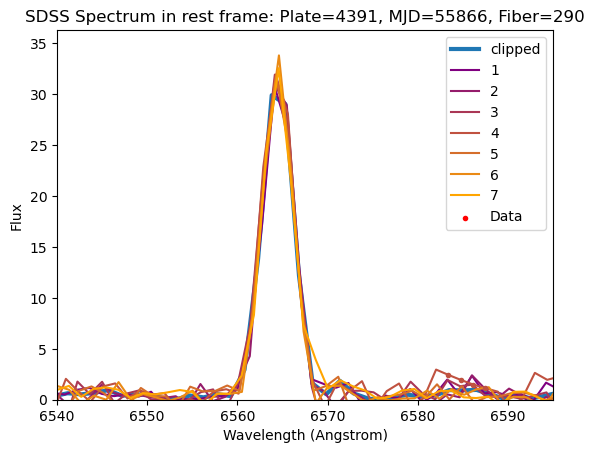

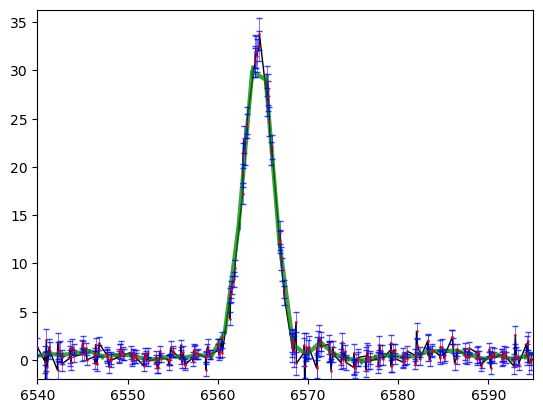

22
4412-55912-317


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


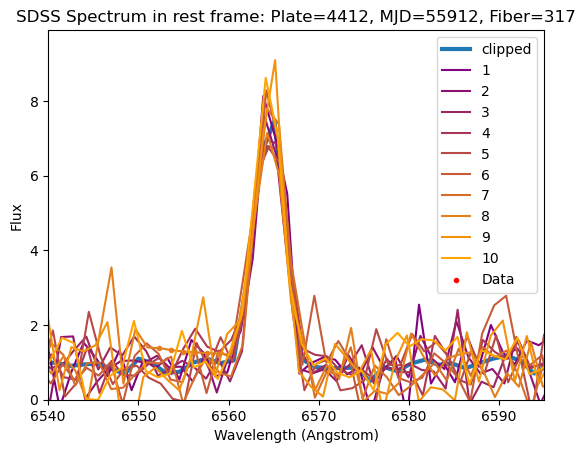

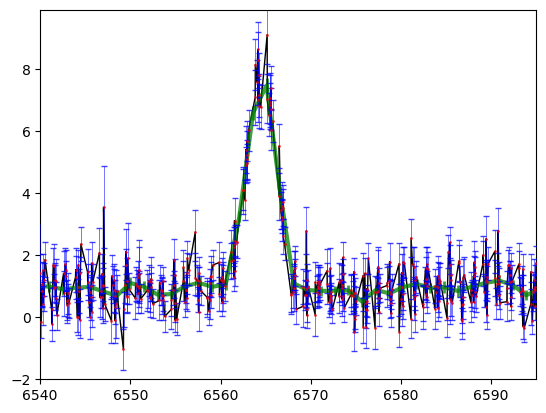

23
4445-55622-812


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


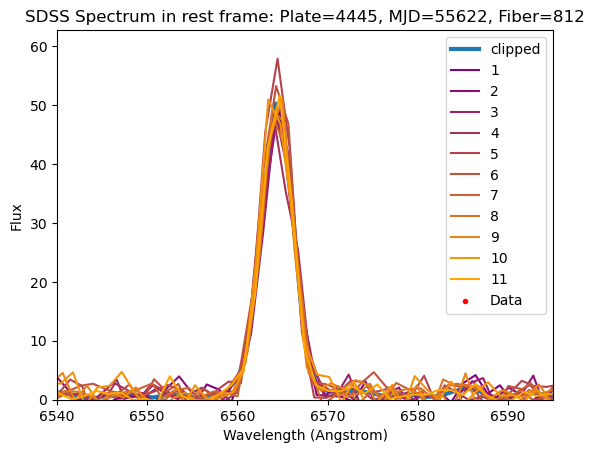

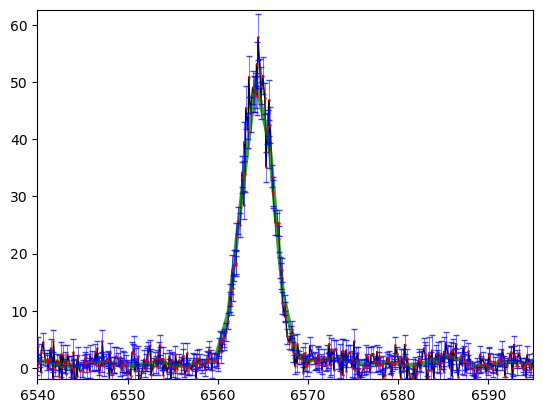

24
4456-55537-872


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


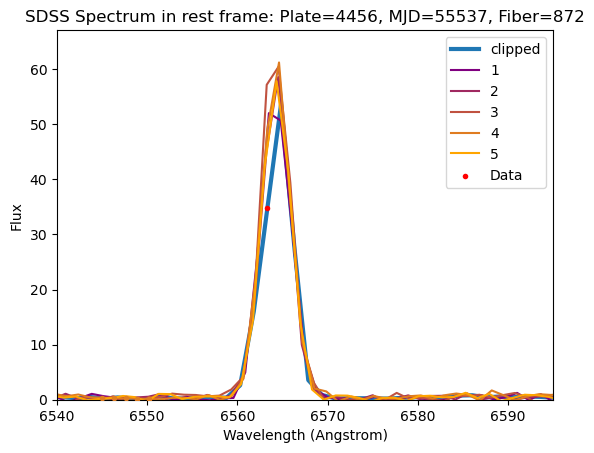

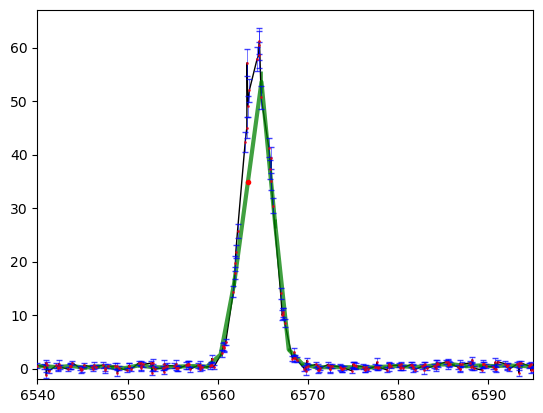

25
4612-55590-111


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


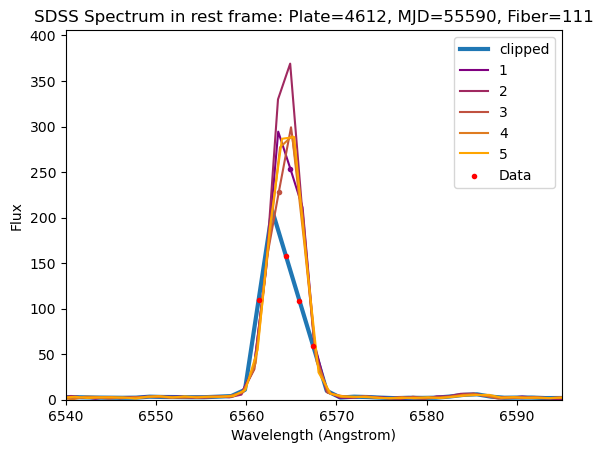

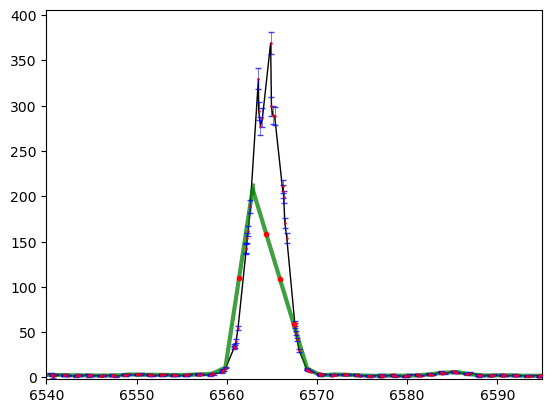

26
4614-55604-502


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


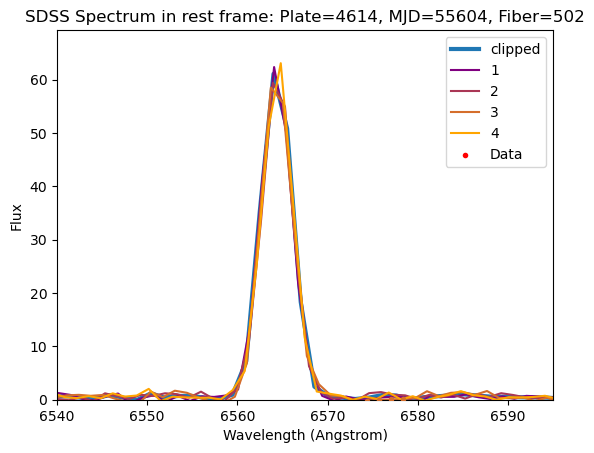

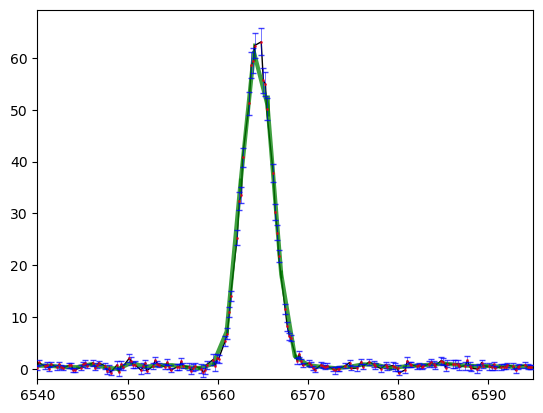

27
4622-55629-262


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


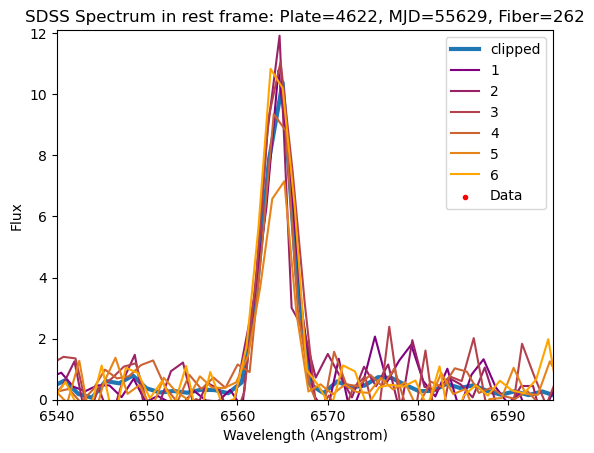

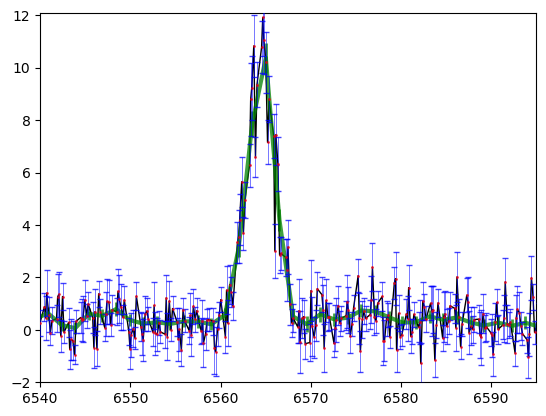

28
4638-55956-131


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


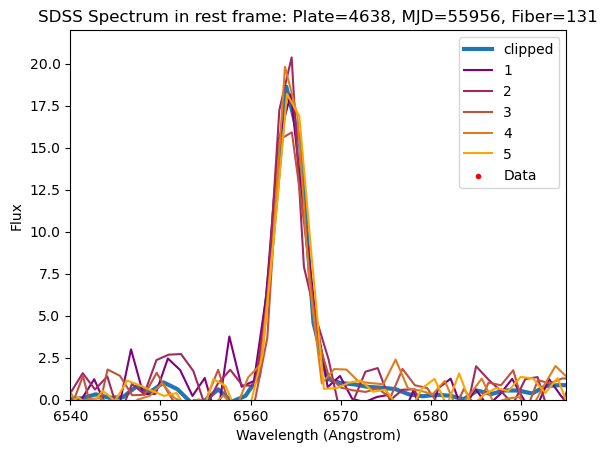

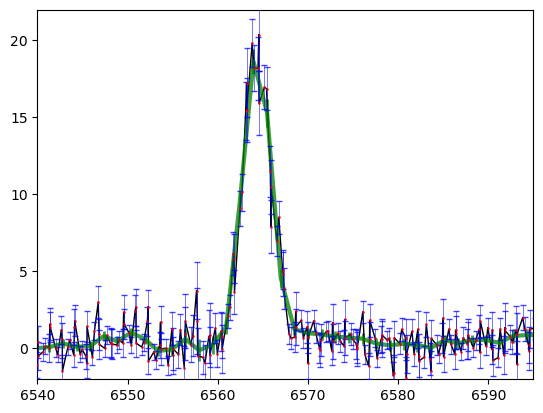

29
4653-55622-332


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


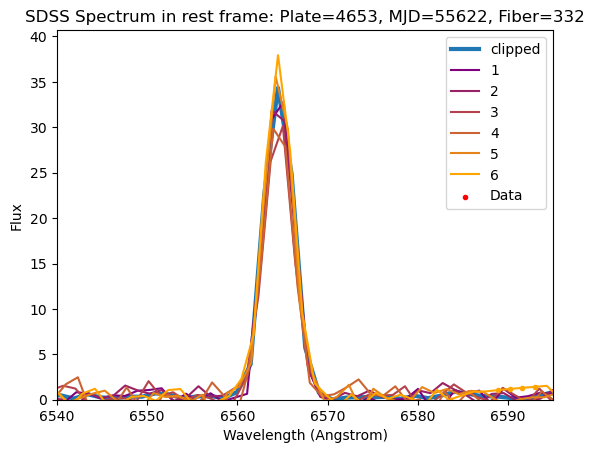

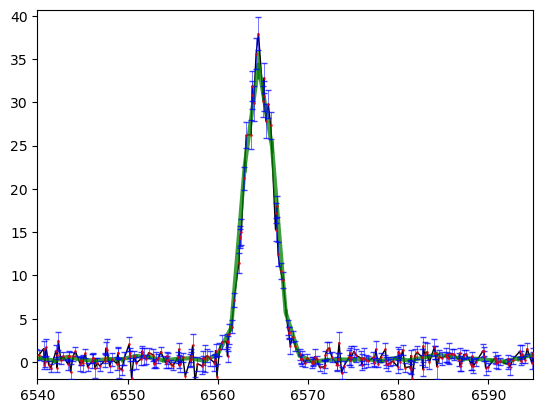

30
4699-55684-531


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


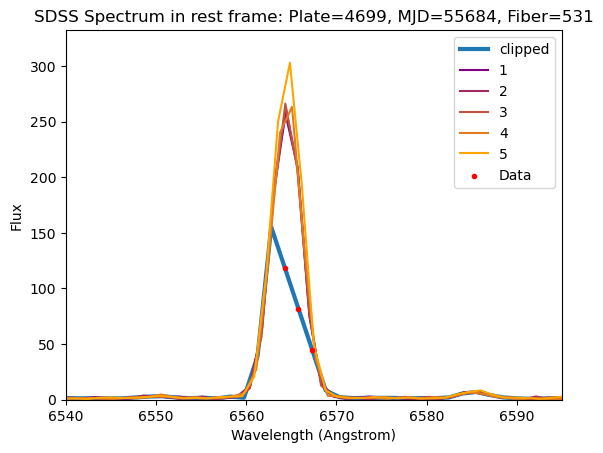

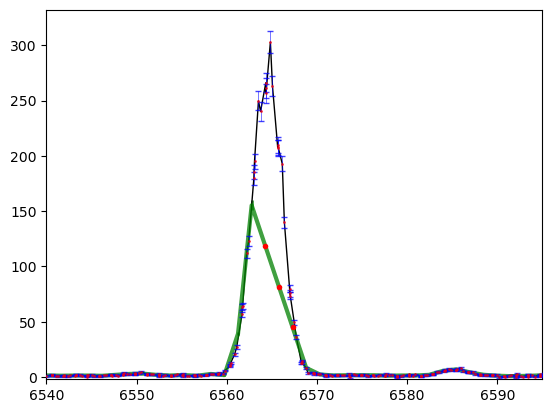

31
4752-55653-166


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


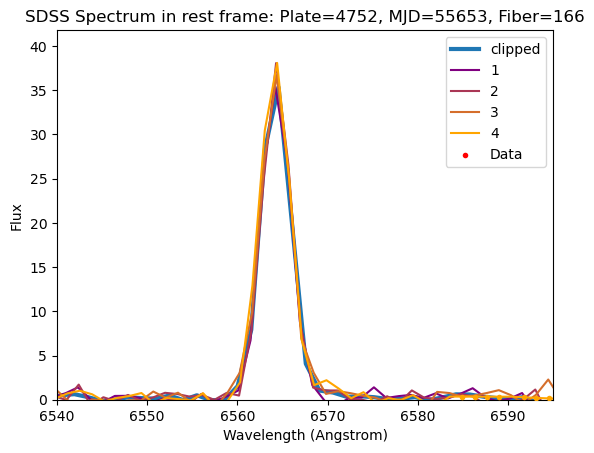

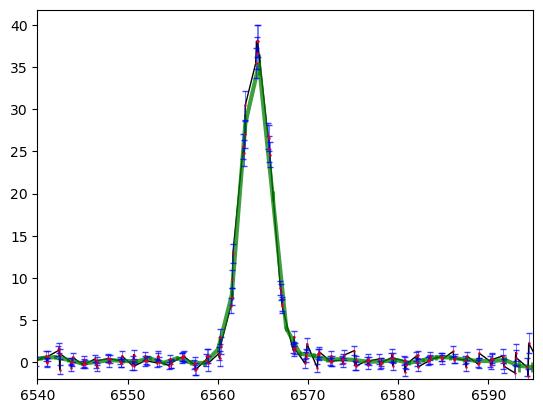

32
4772-55654-849


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


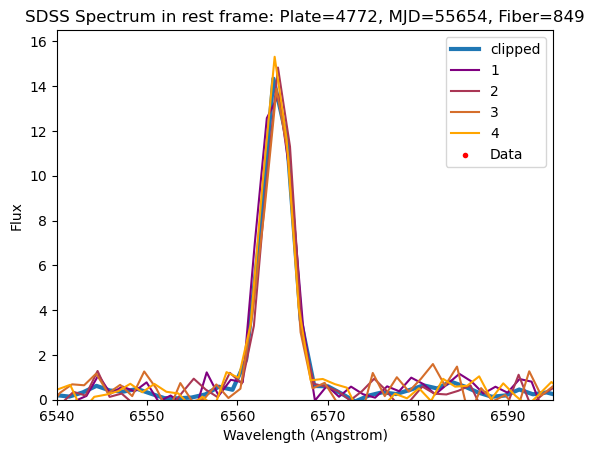

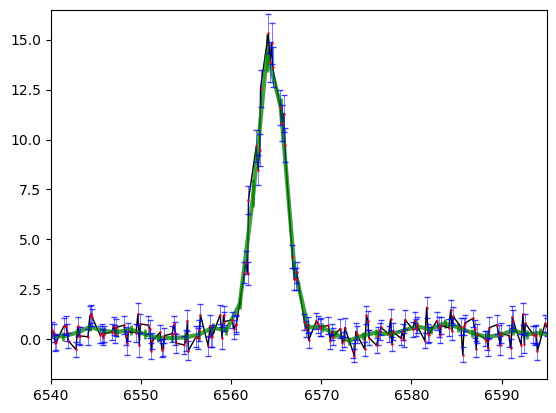

33
4806-55688-564


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


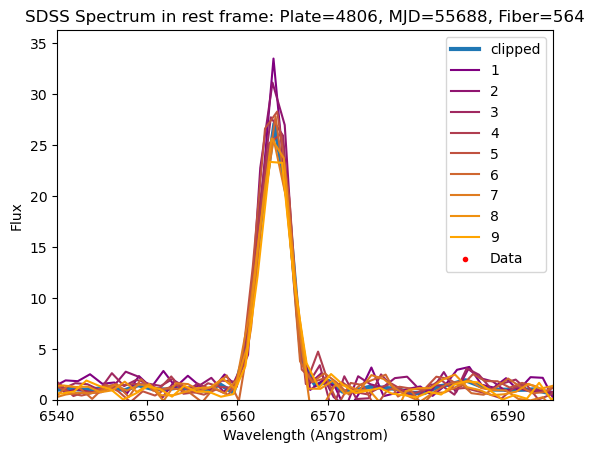

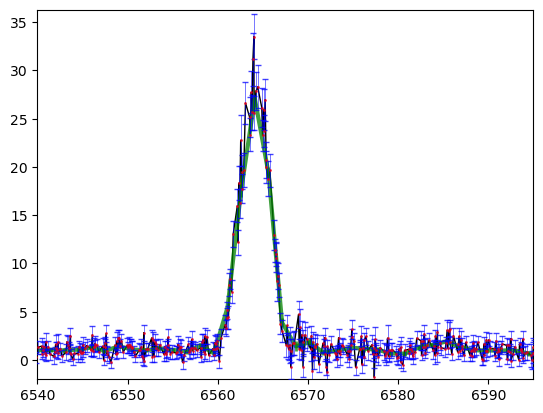

34
4839-55703-701


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


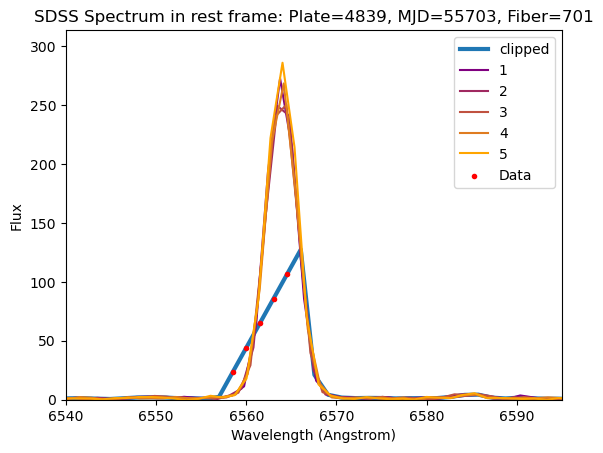

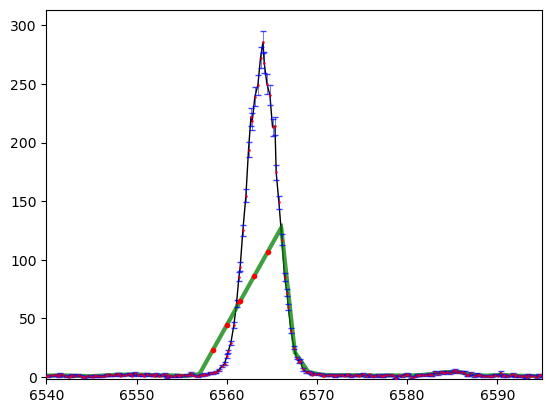

35
4851-55680-128


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


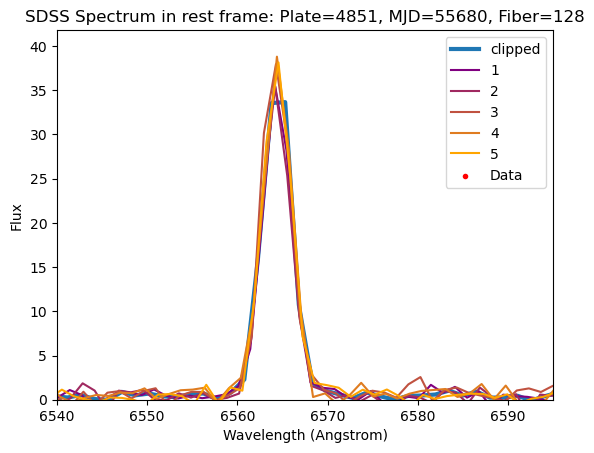

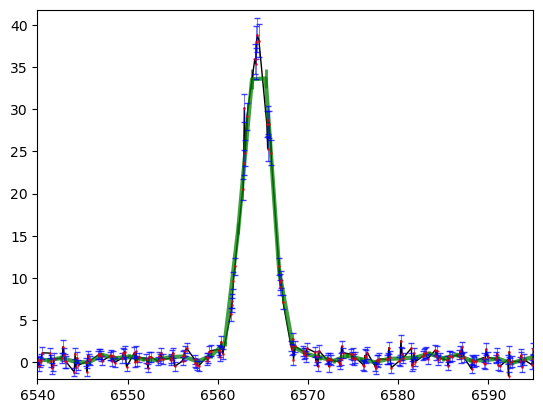

36
4895-55708-827


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


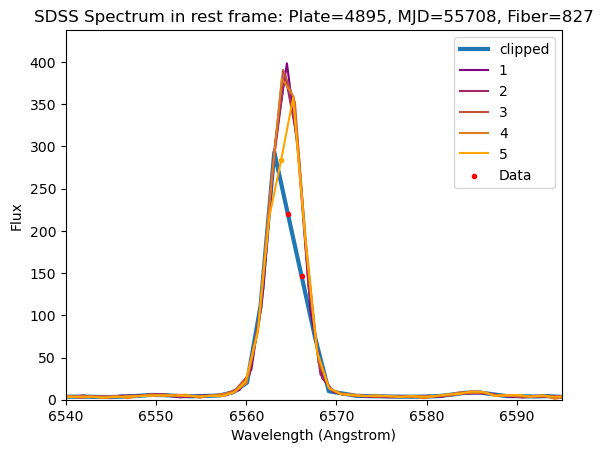

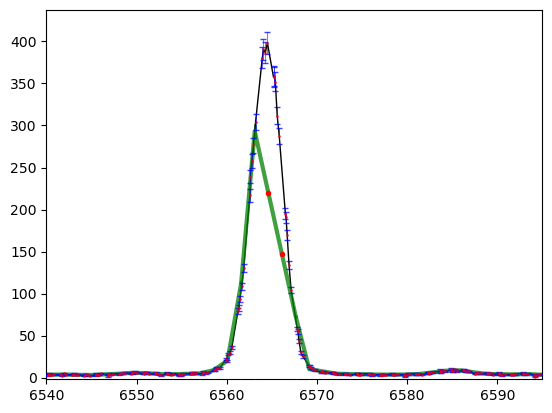

37
4977-56047-184


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


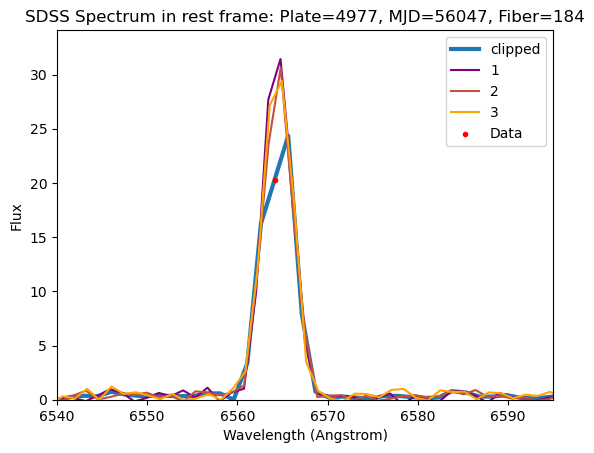

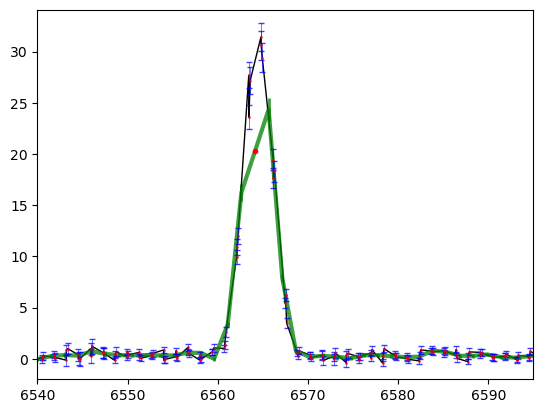

38
5133-55860-203


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


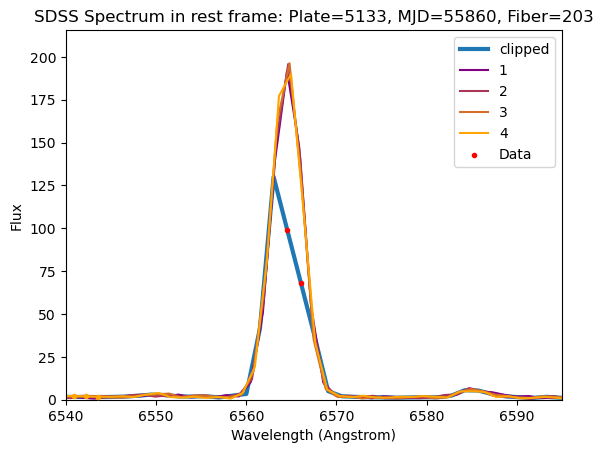

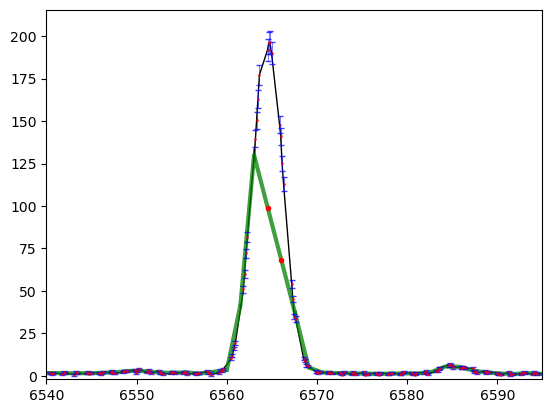

39
5297-55913-379


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


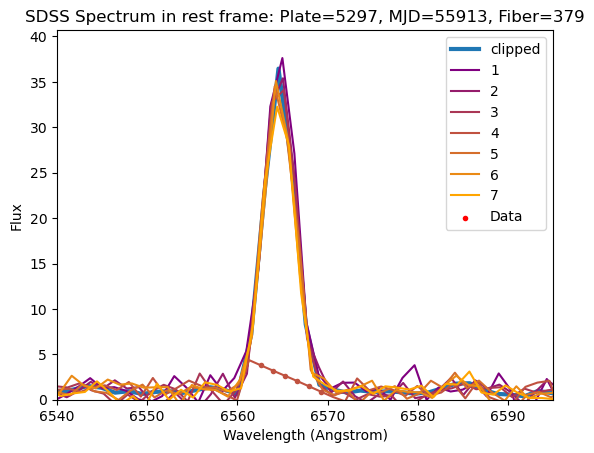

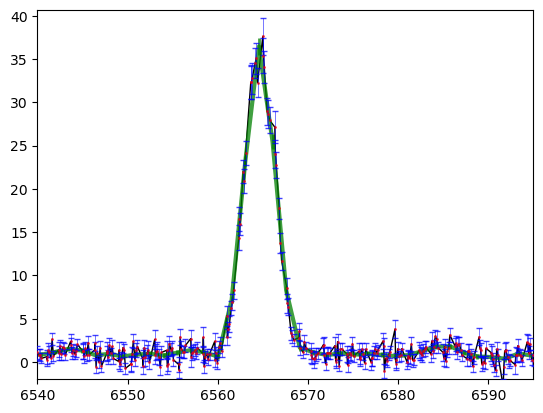

40
5316-55955-108


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


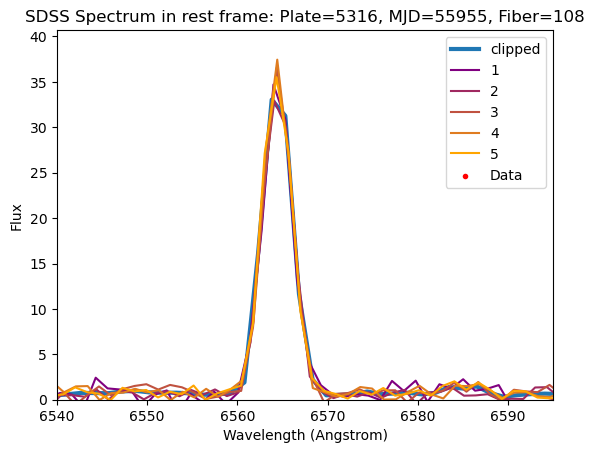

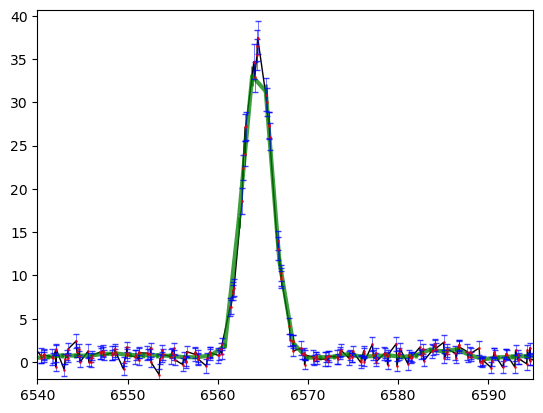

41
5695-55978-162


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


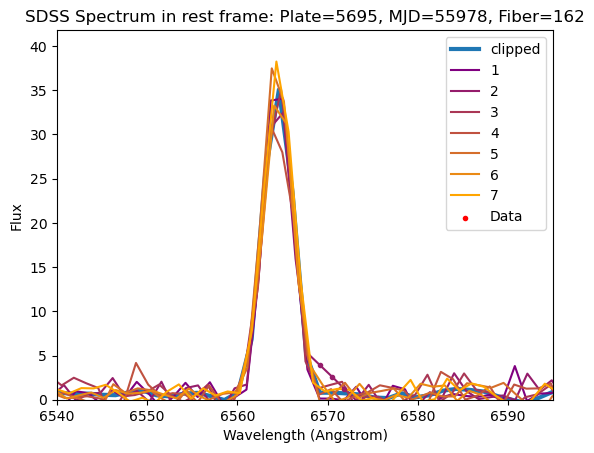

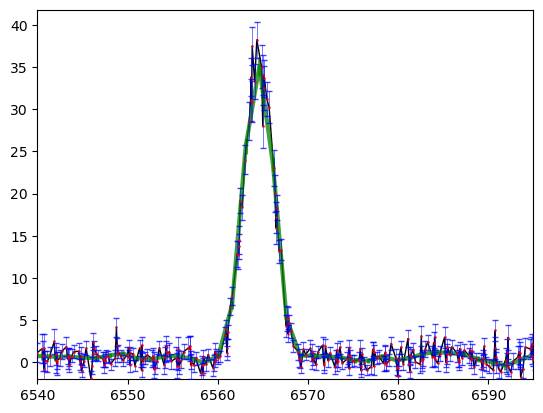

42
5900-56043-511


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


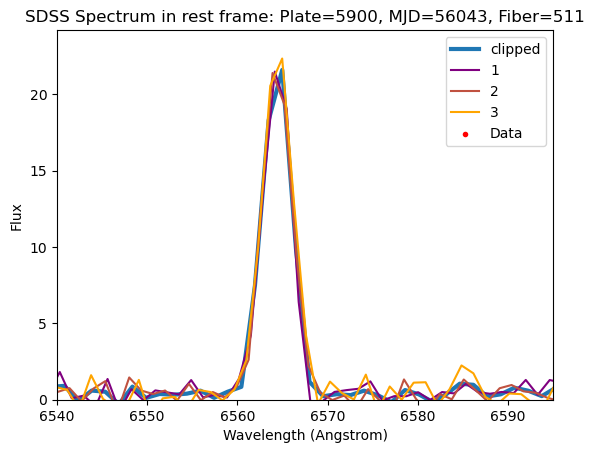

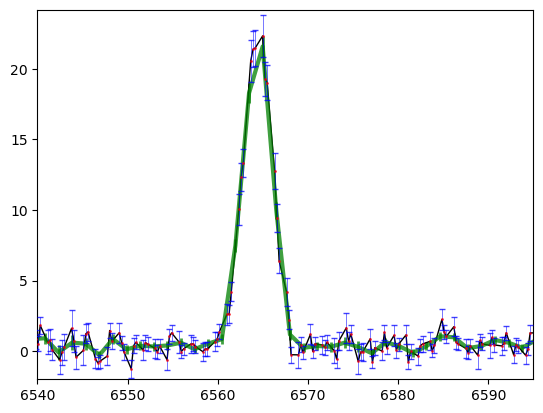

43
5974-56314-346


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


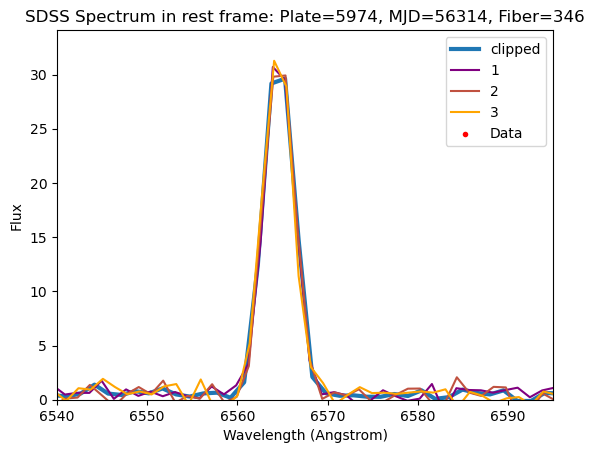

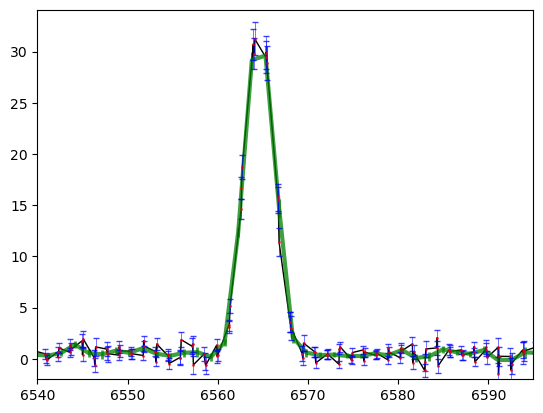

44
6254-56268-654


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


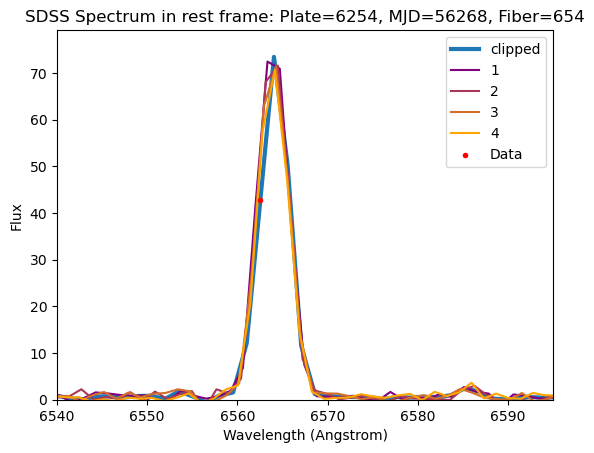

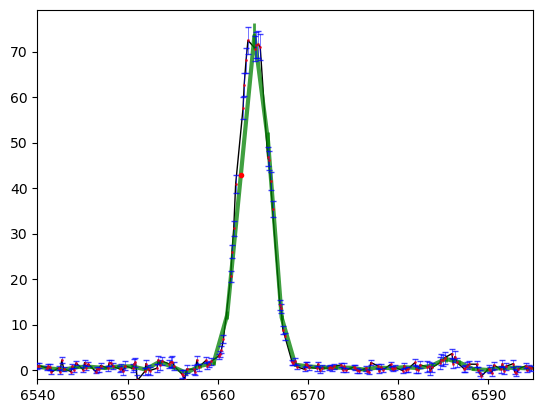

45
6262-56267-718


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


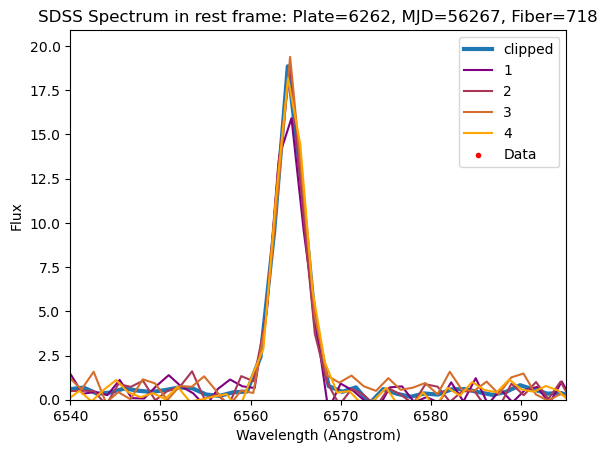

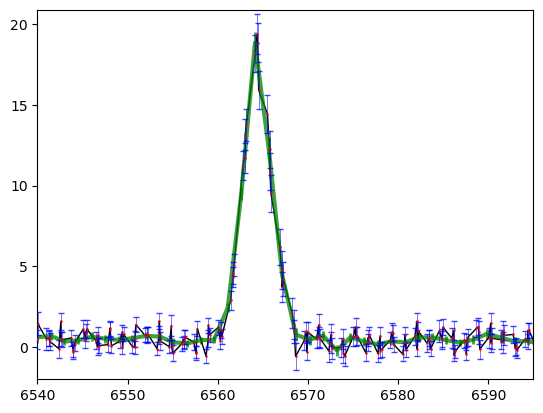

46
6272-56325-512


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


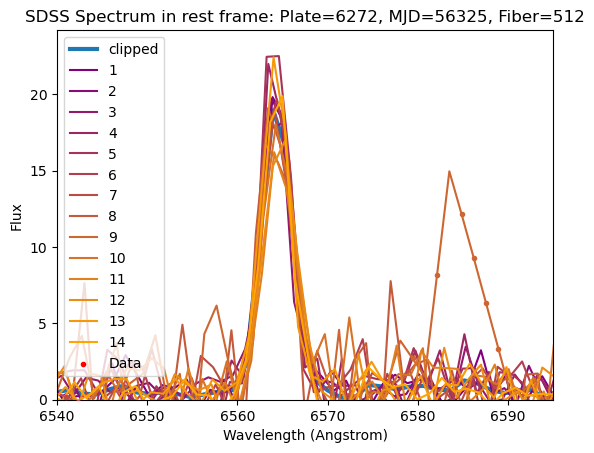

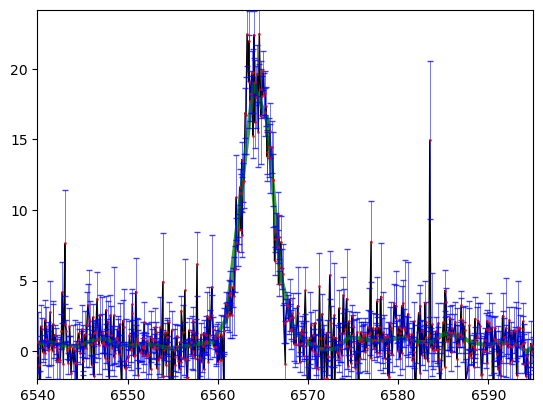

47
6311-56447-384


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


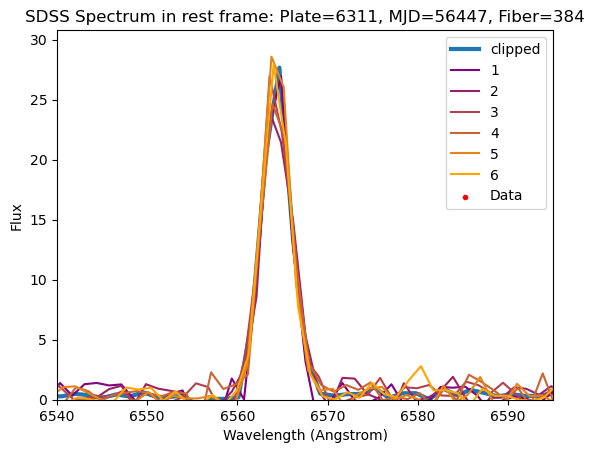

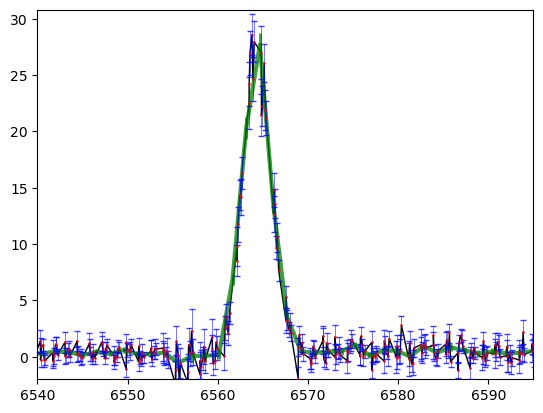

48
6409-56306-367


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


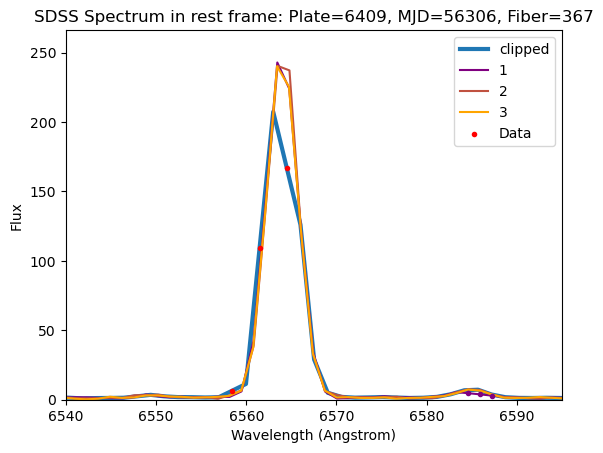

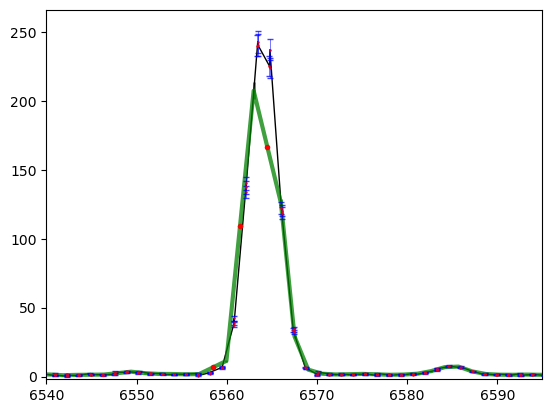

49
6445-56366-516


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


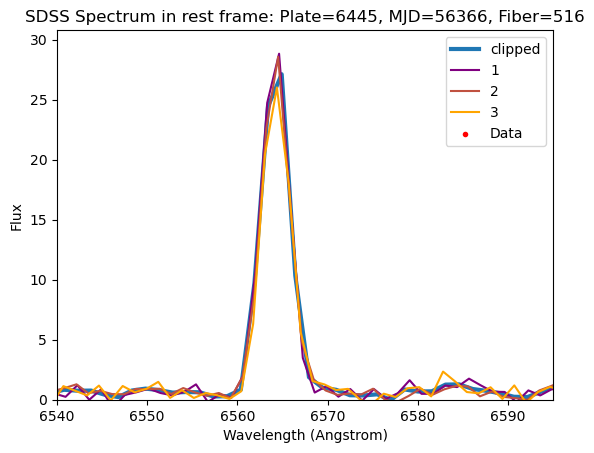

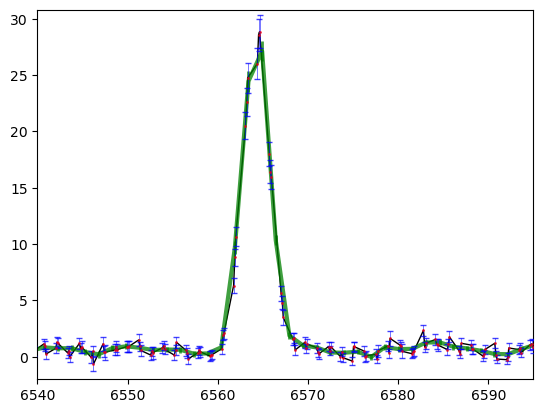

50
6445-56366-937


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


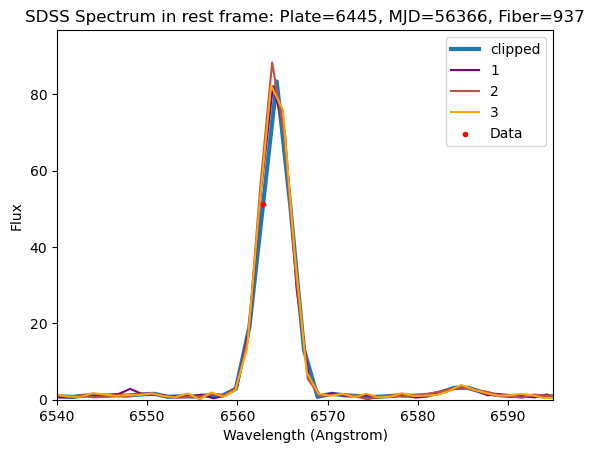

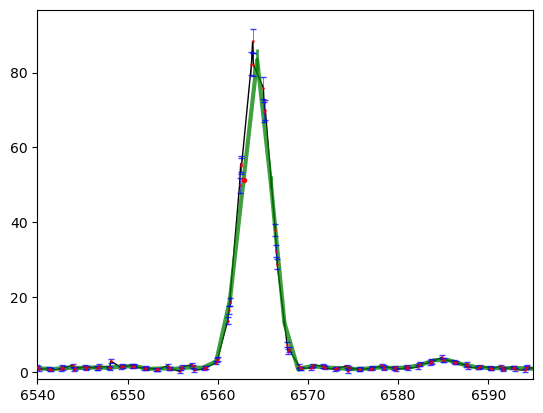

51
6480-56340-570


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


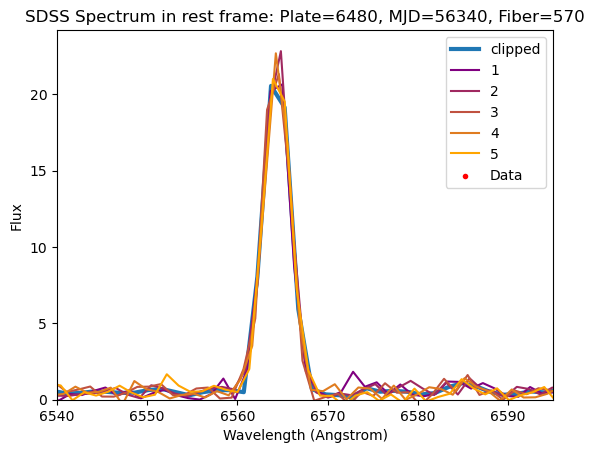

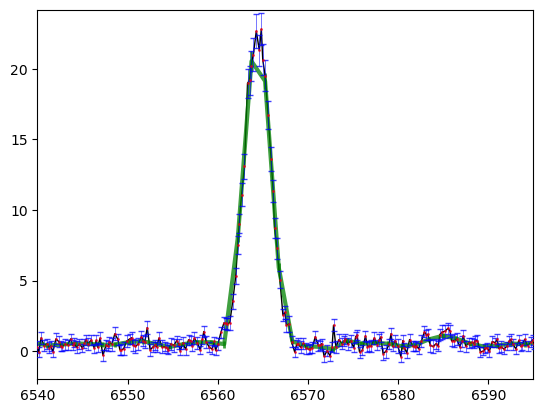

52
6512-56567-344


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


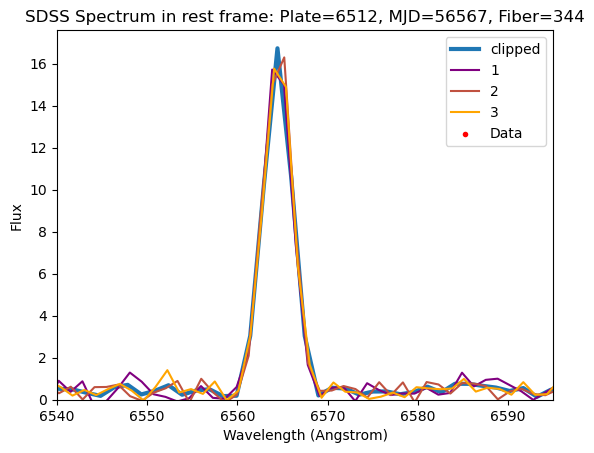

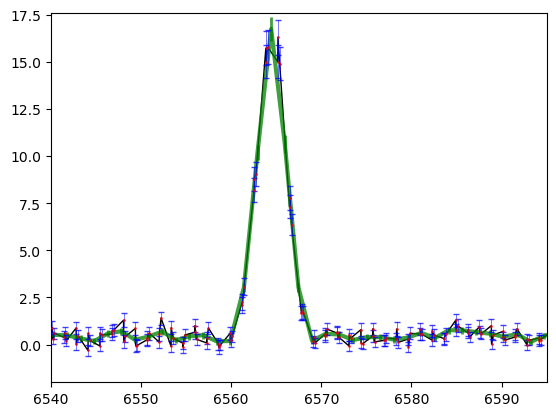

53
6513-56543-640


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


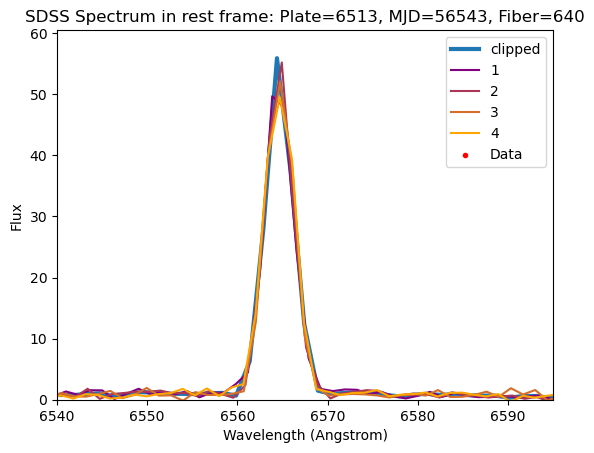

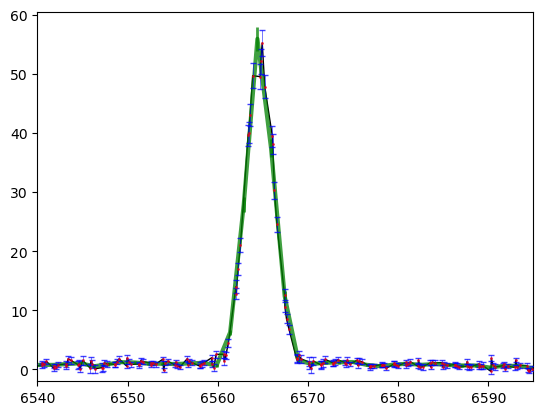

54
6514-56487-217


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


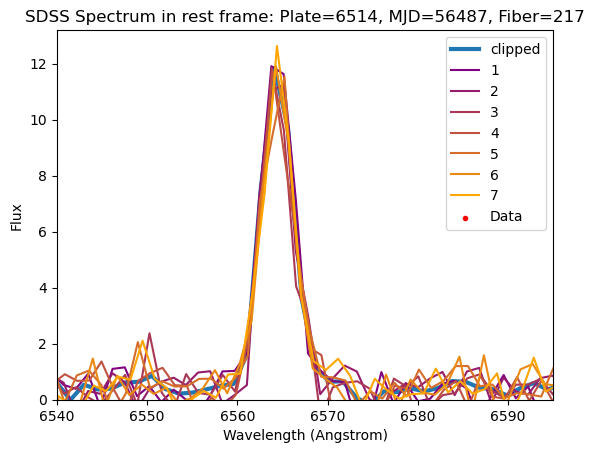

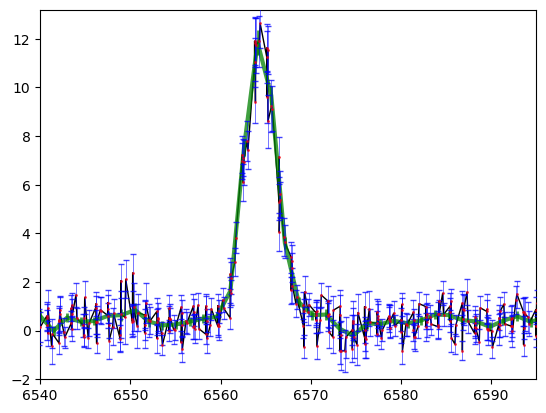

55
6518-56567-726


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


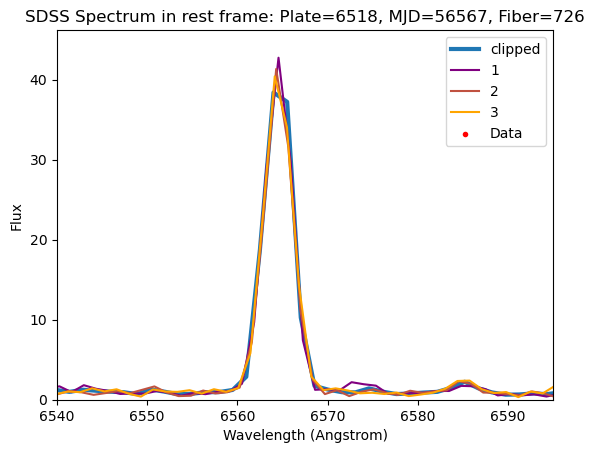

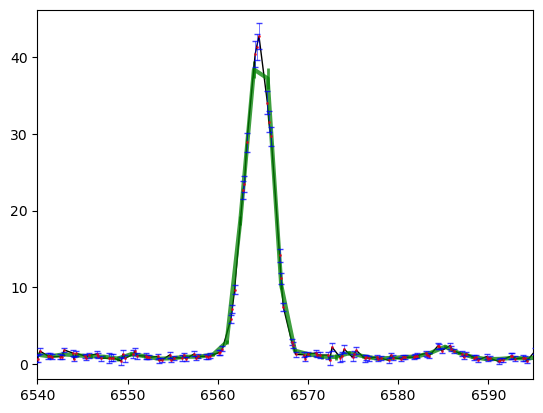

56
6521-56537-132


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


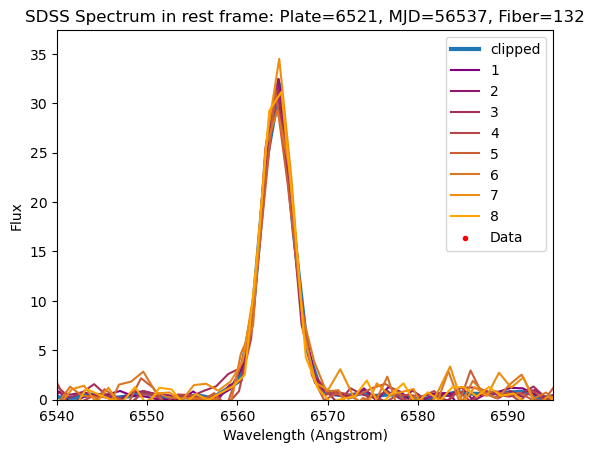

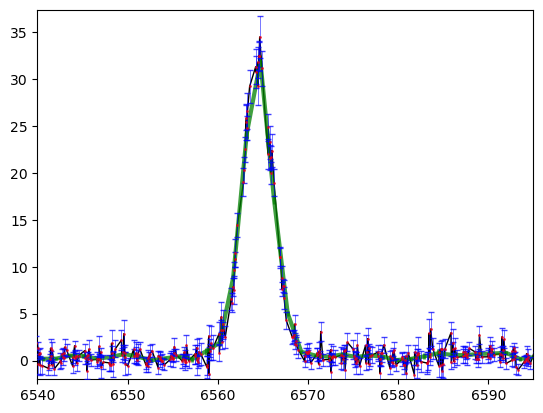

57
6694-56386-172


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


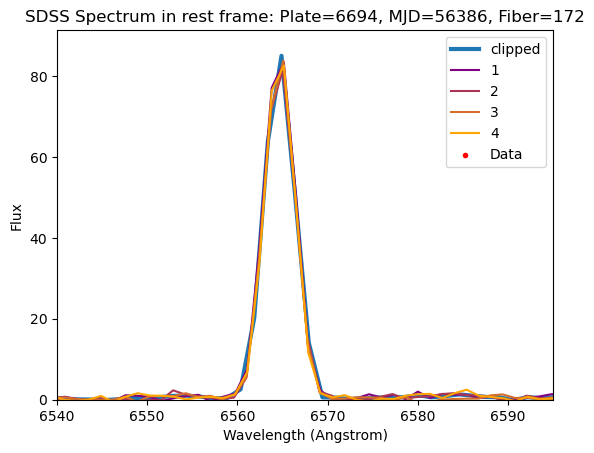

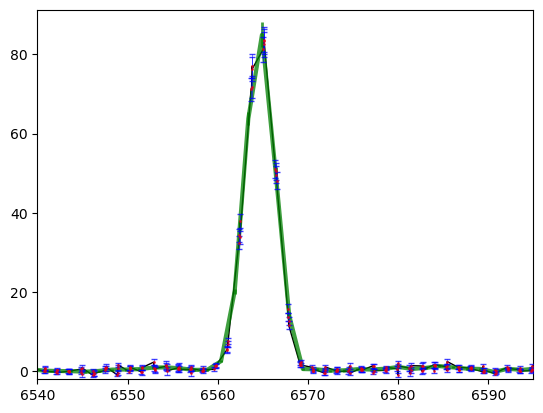

58
6715-56449-448


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


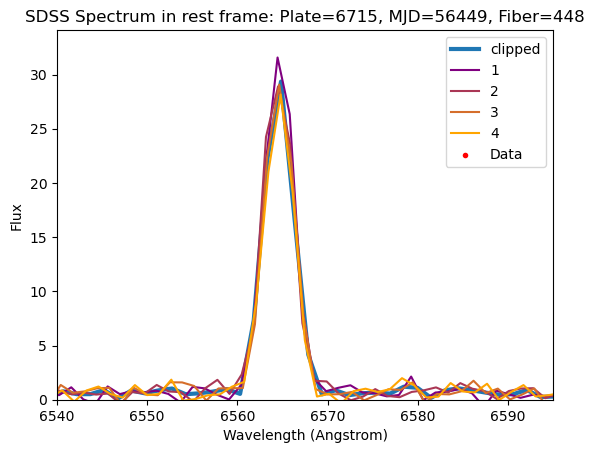

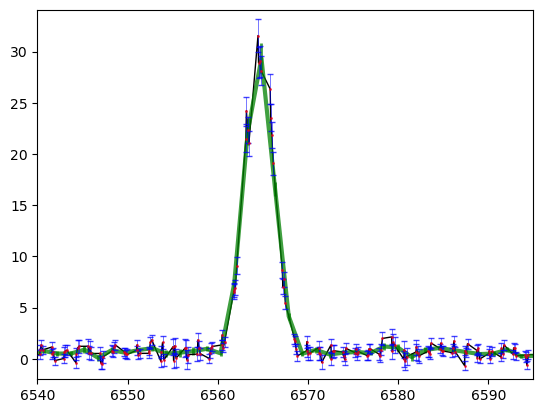

59
6975-56720-648


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


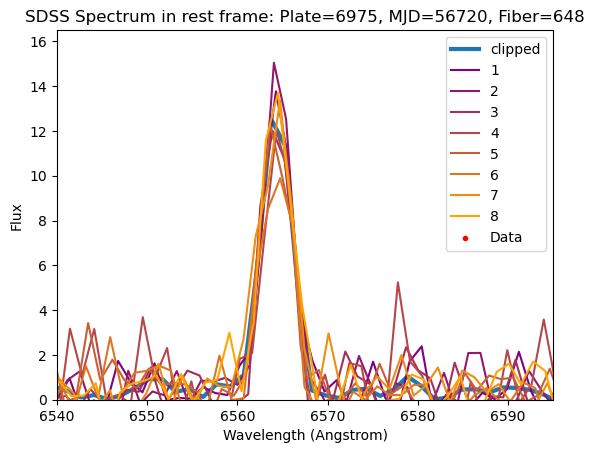

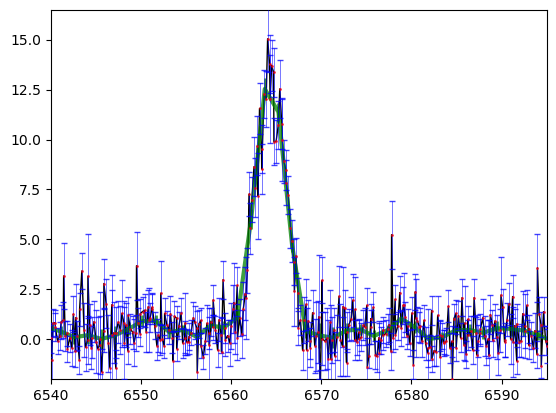

60
7027-56448-420


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


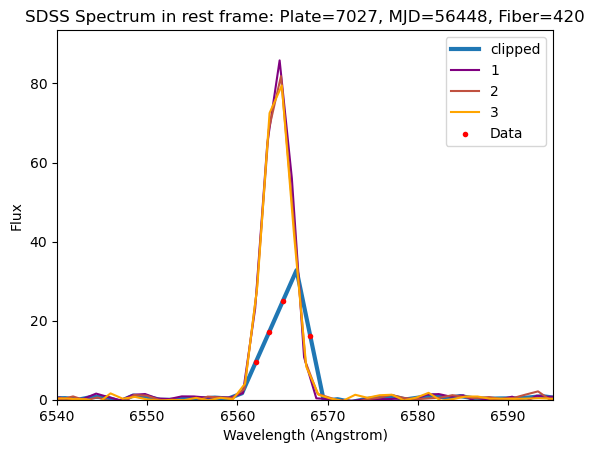

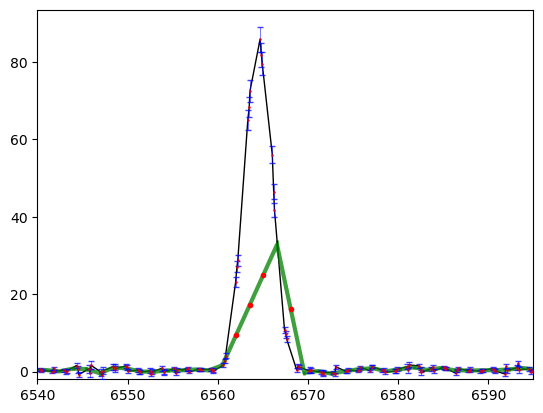

61
7034-56564-540


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


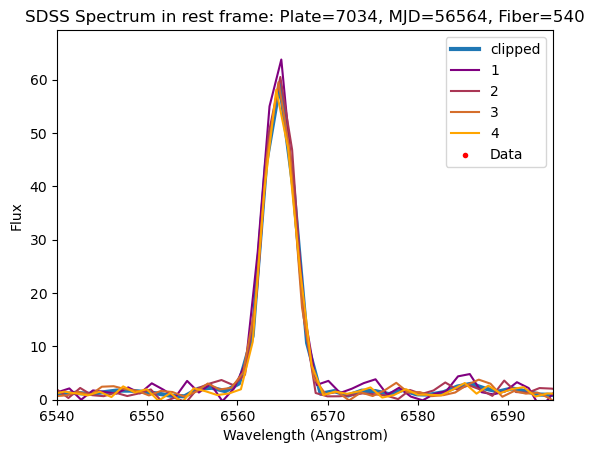

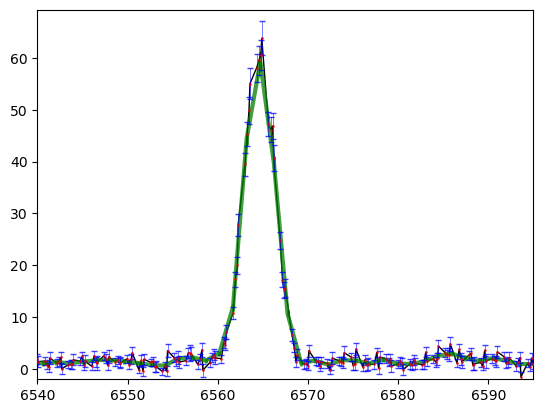

62
7081-56684-1000


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


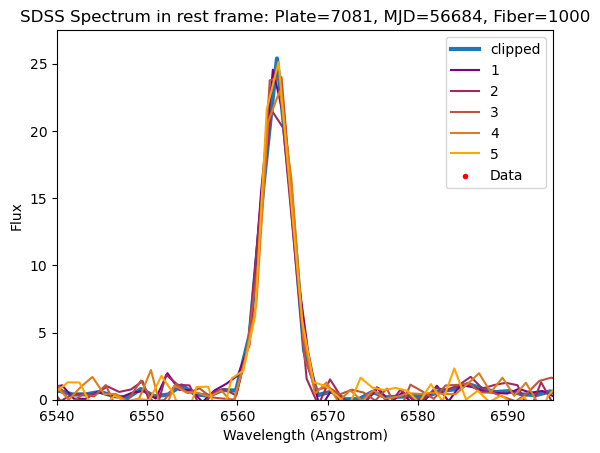

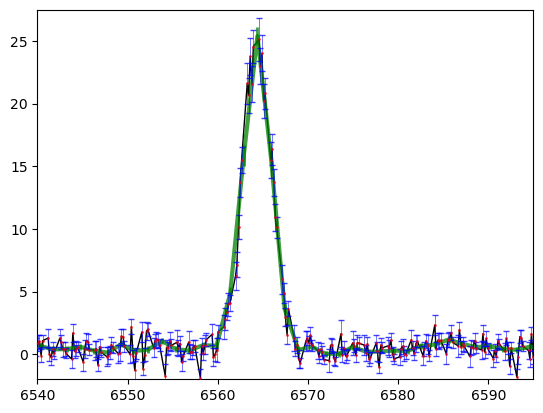

63
7151-56598-404


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


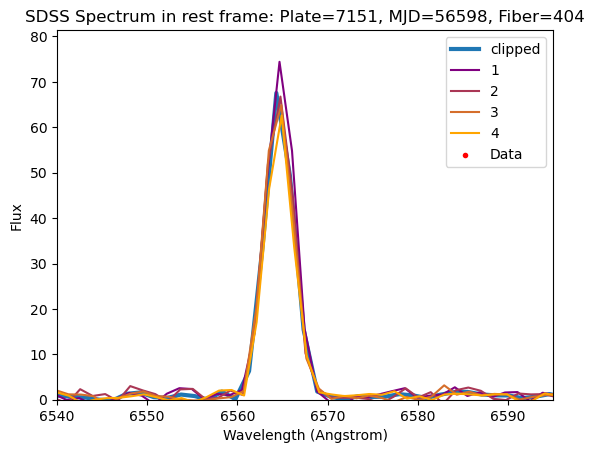

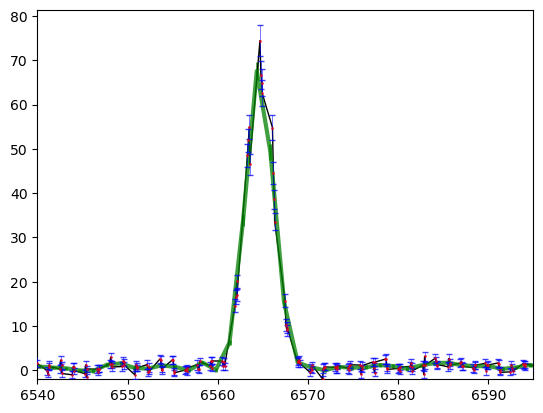

64
7153-56904-861


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


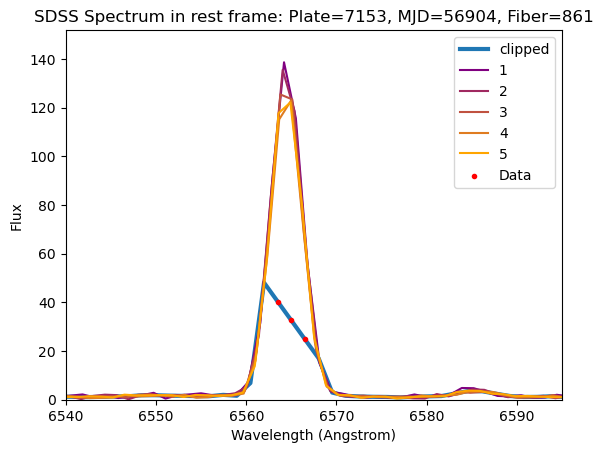

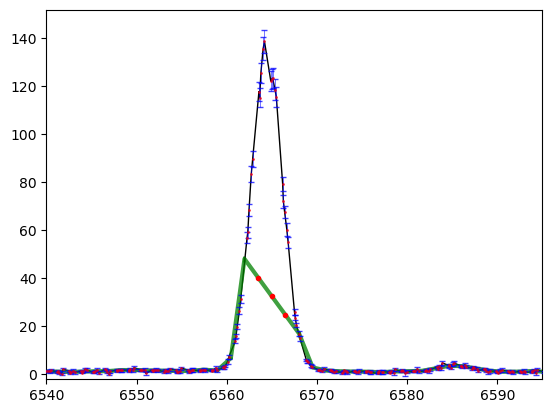

65
7289-57039-102


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


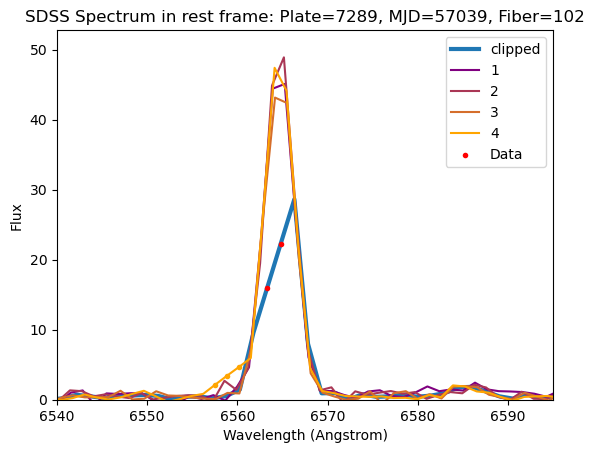

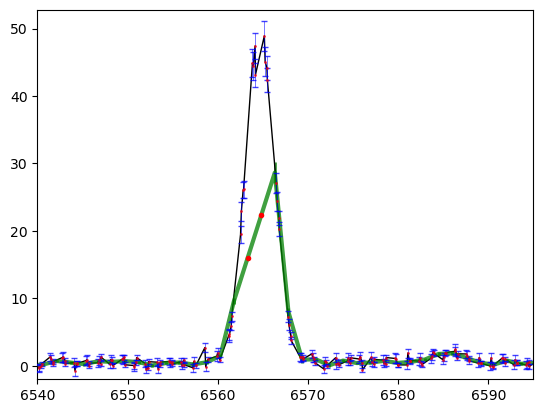

66
7315-56685-165


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


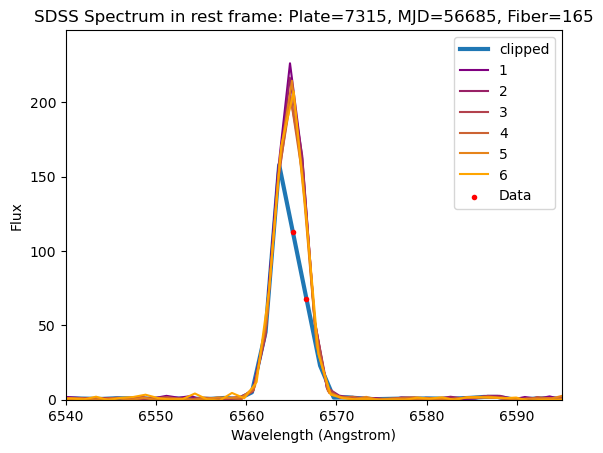

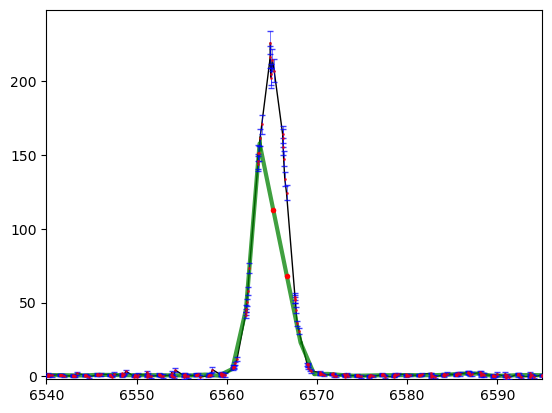

67
7336-56656-363


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


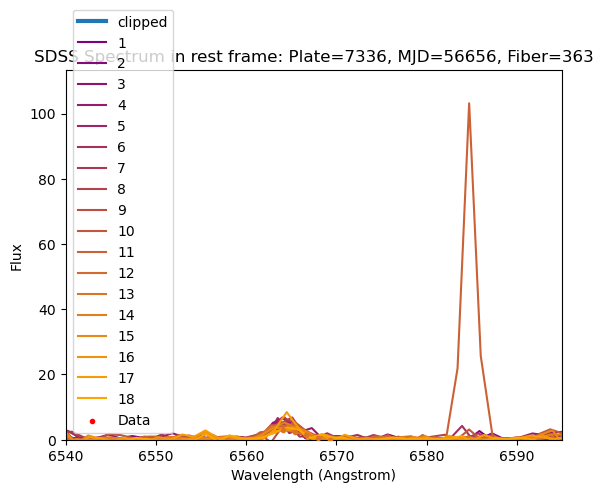

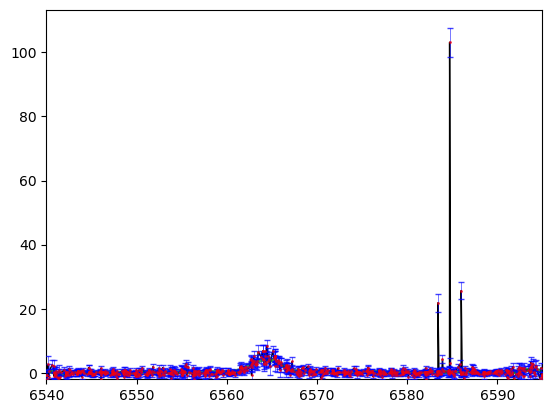

68
7396-56809-782


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


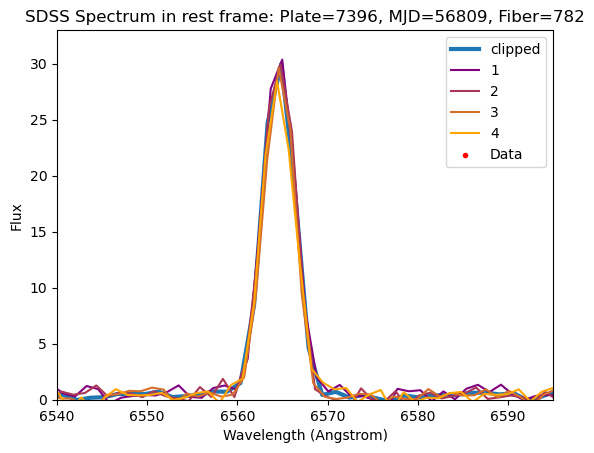

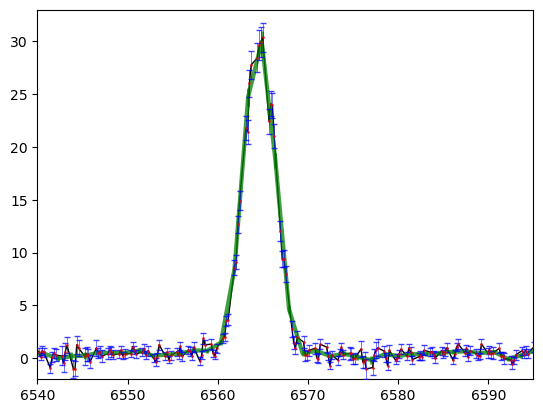

69
7404-56776-446


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


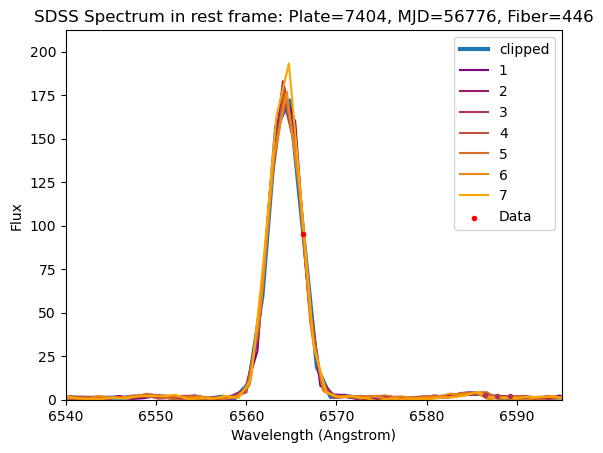

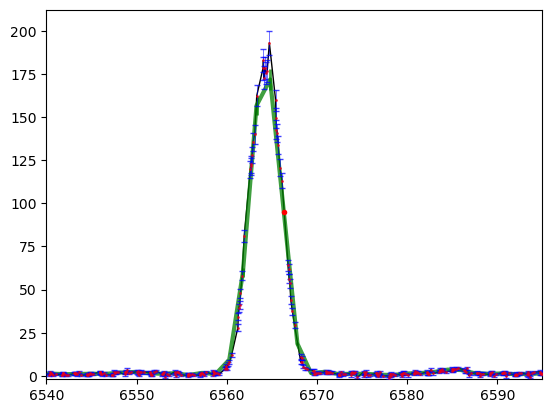

70
7427-56751-620


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


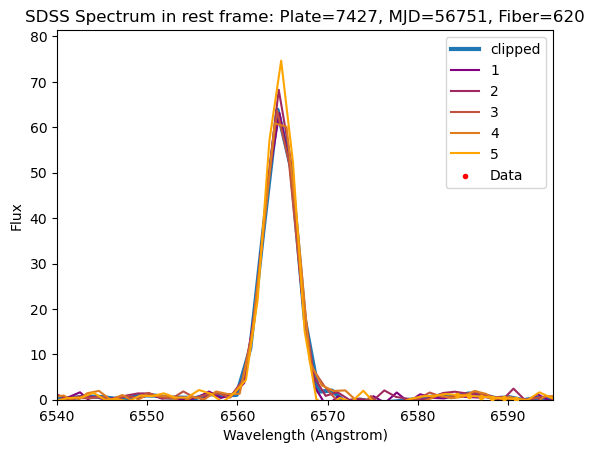

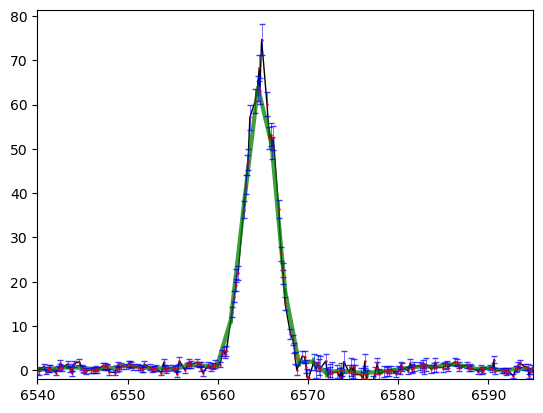

71
7572-56944-383


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


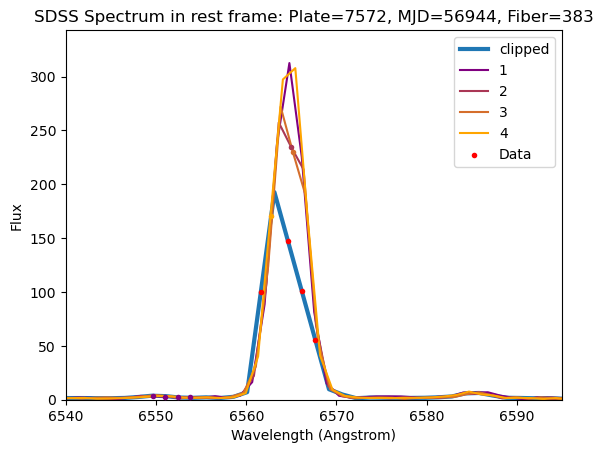

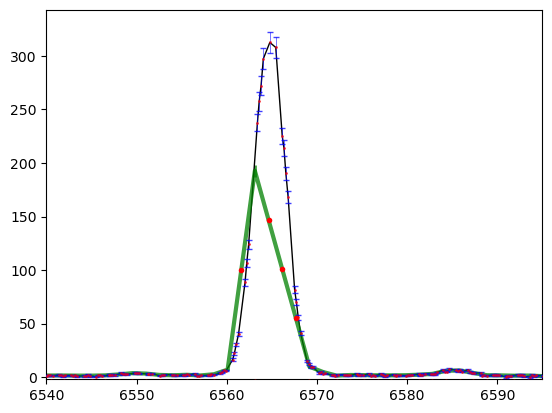

72
7581-56949-122


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


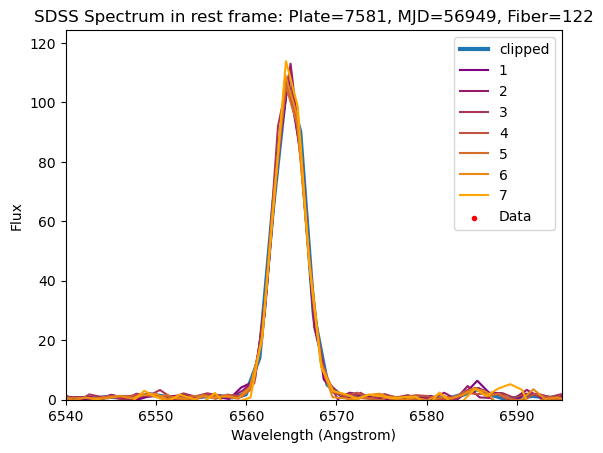

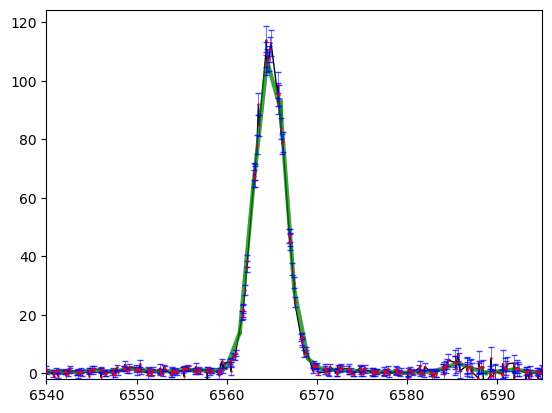

73
7626-56934-72


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


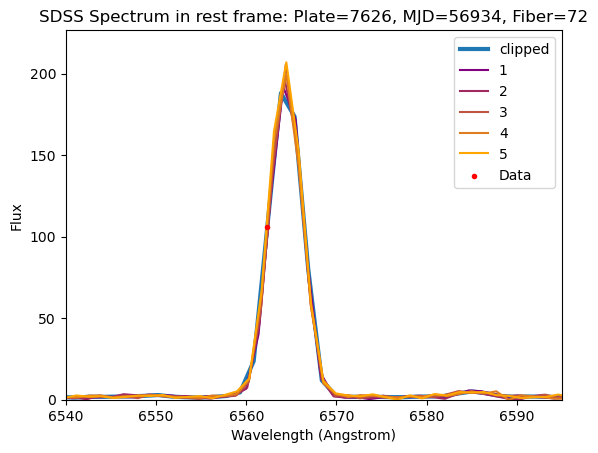

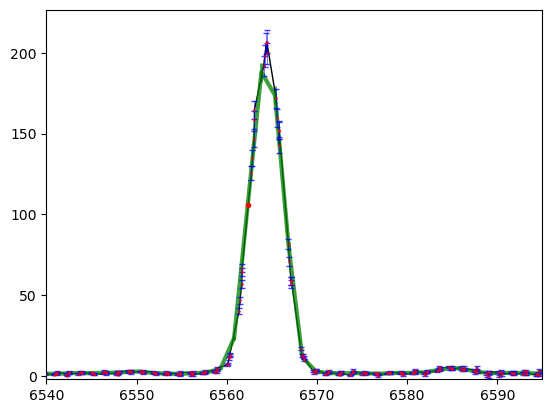

74
7629-56988-135


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


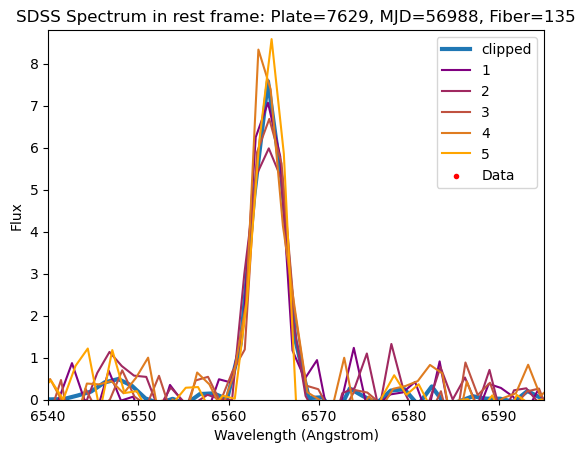

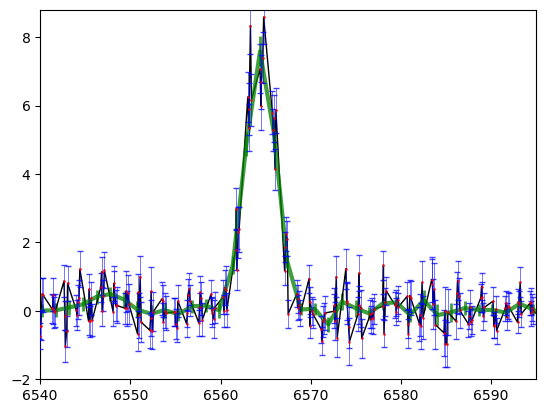

75
7643-57302-720


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


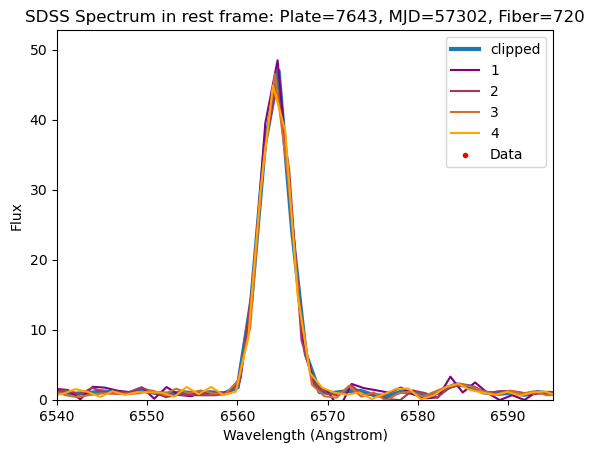

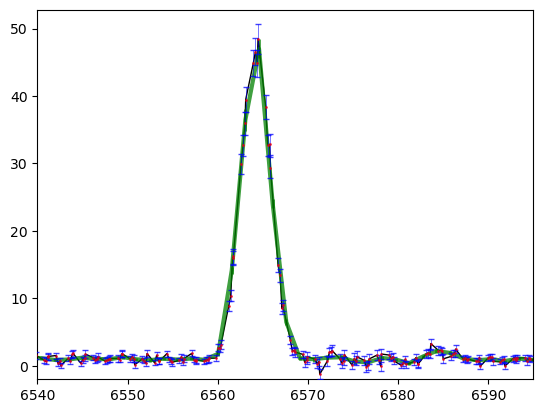

76
7653-57306-686


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


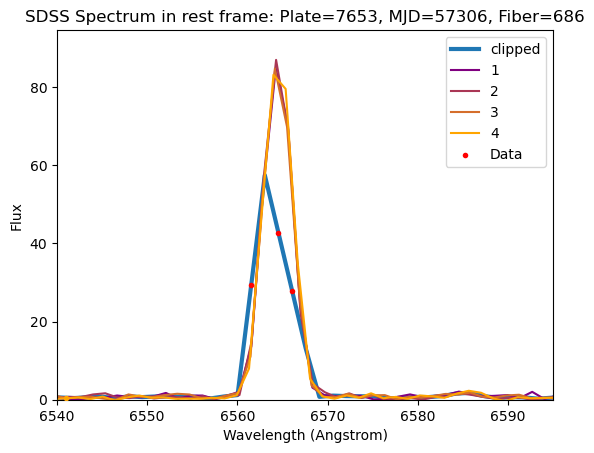

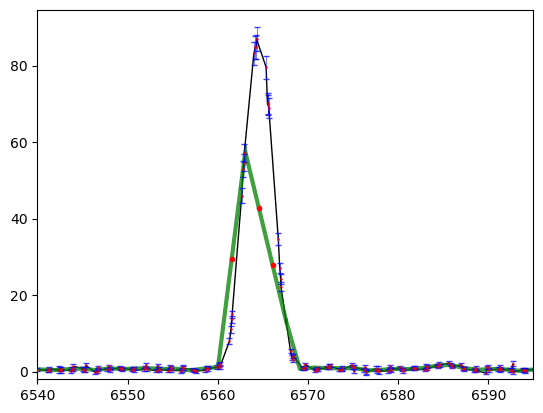

77
7661-57286-304


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


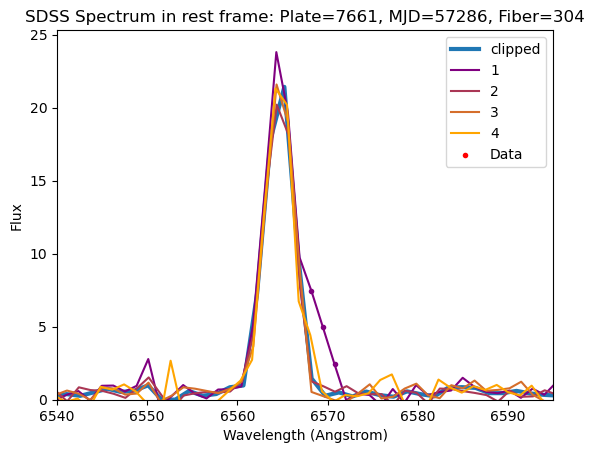

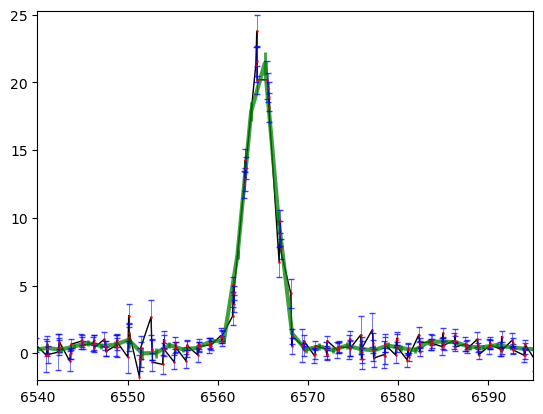

78
7673-57329-421


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


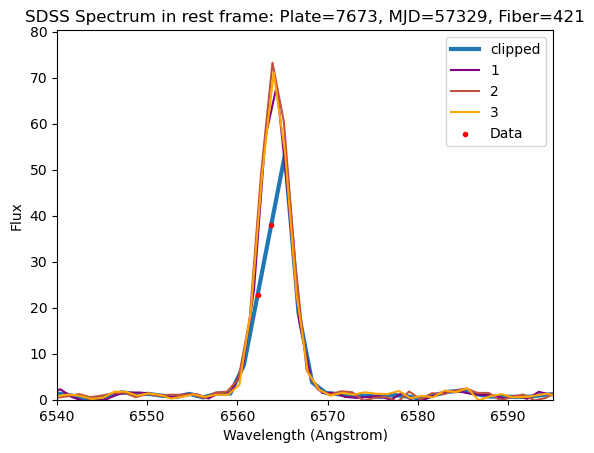

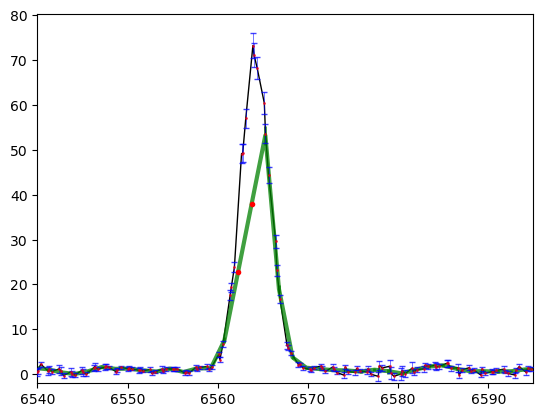

79
7678-57282-159


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


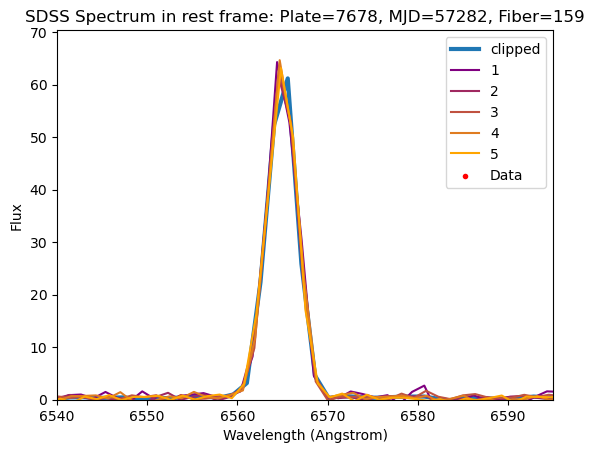

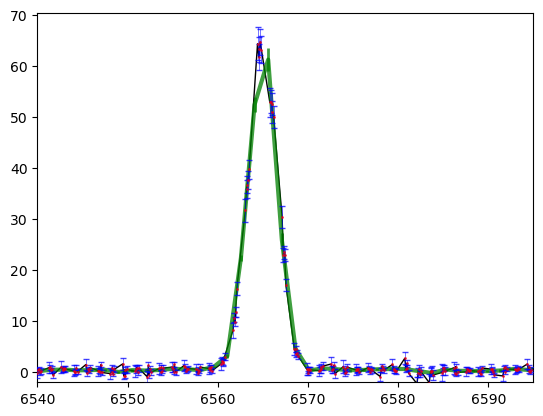

80
7690-57046-910


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


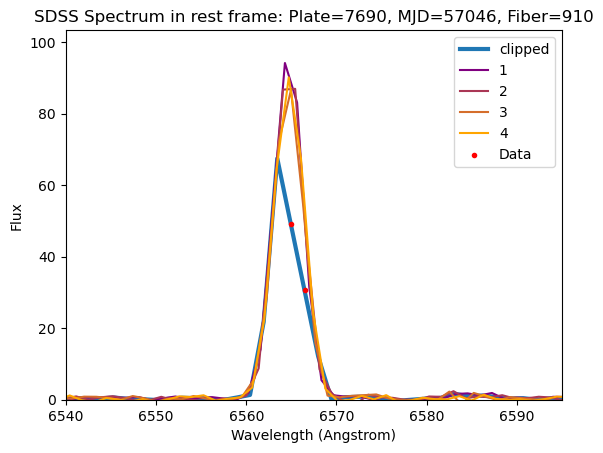

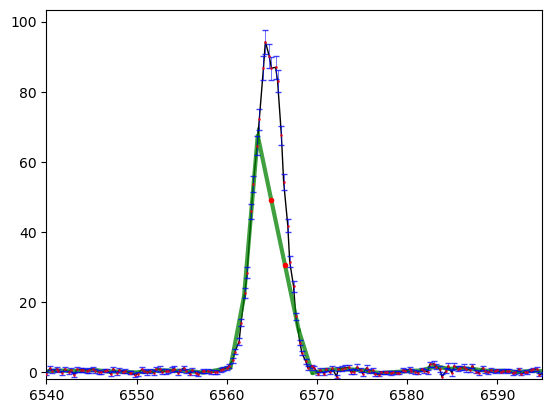

81
7710-58284-291


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


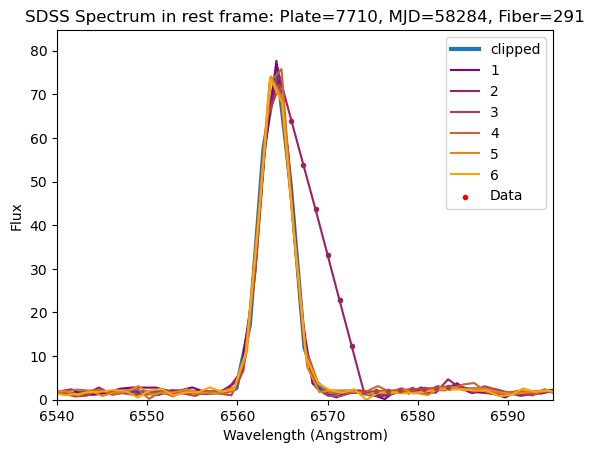

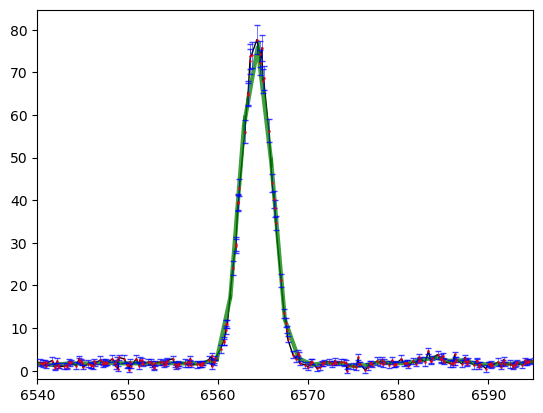

82
7711-57667-88


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


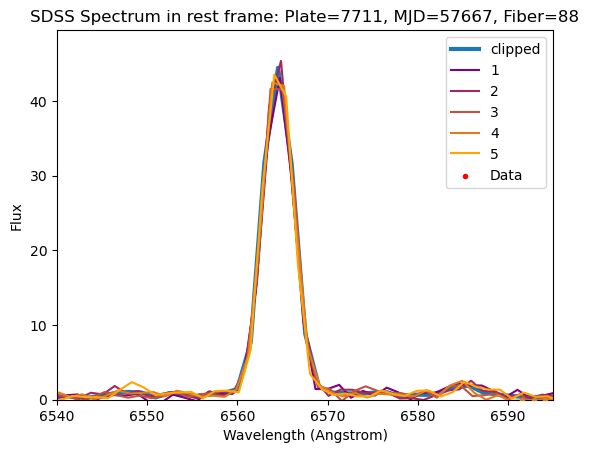

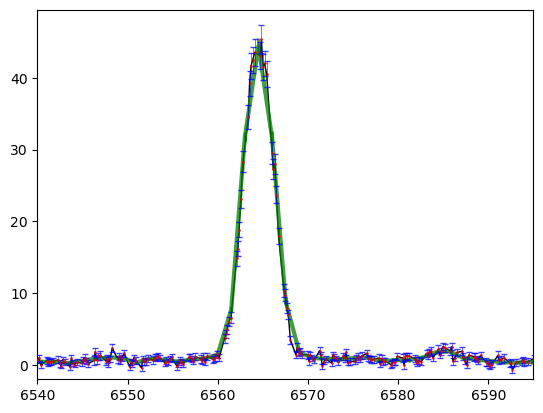

83
7885-57336-549


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


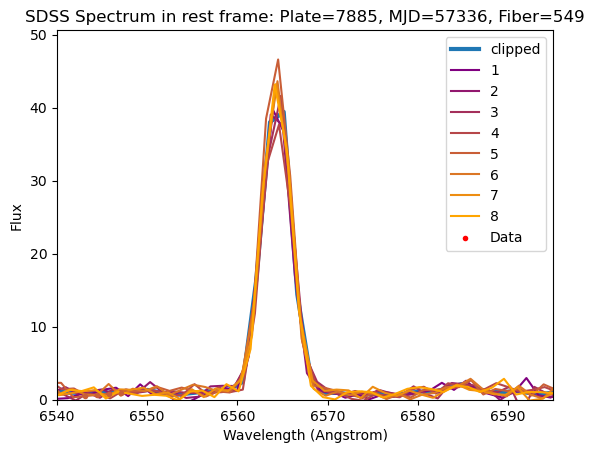

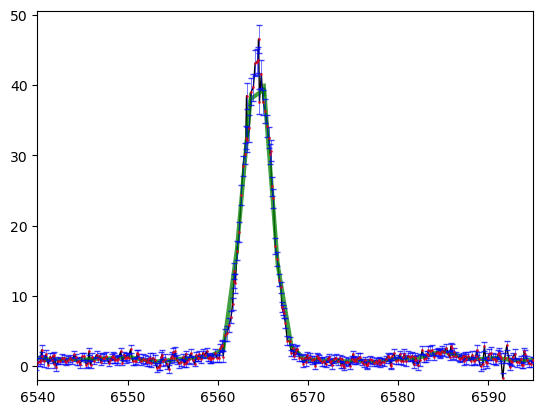

84
8054-57194-43


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


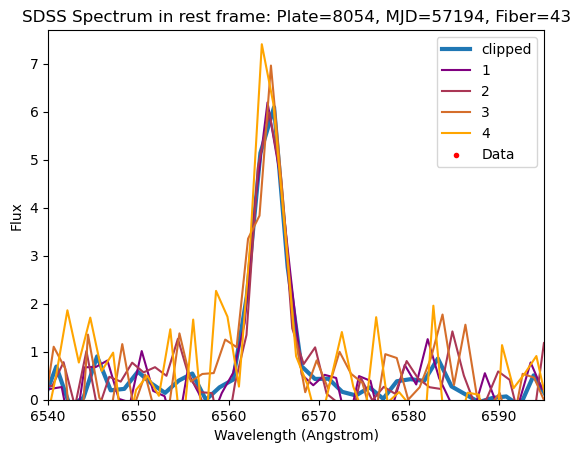

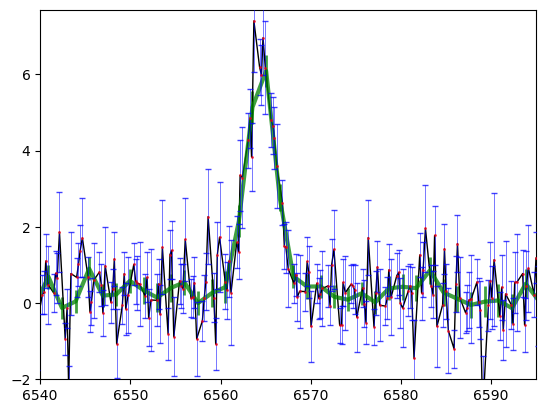

85
8057-57190-545


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


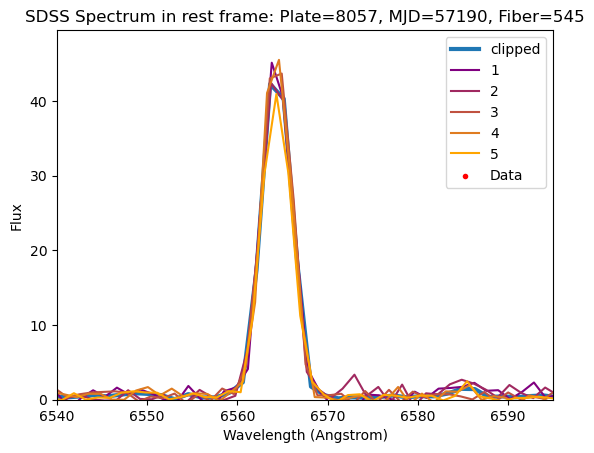

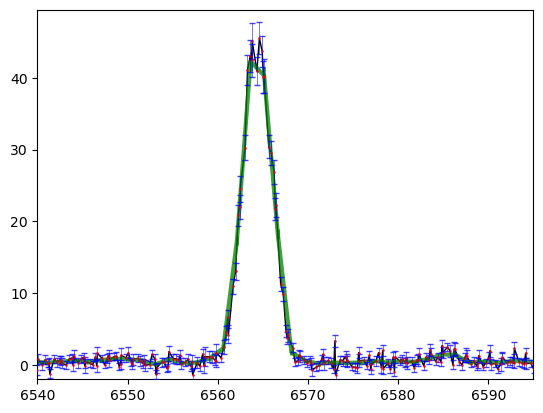

86
8059-57895-836


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


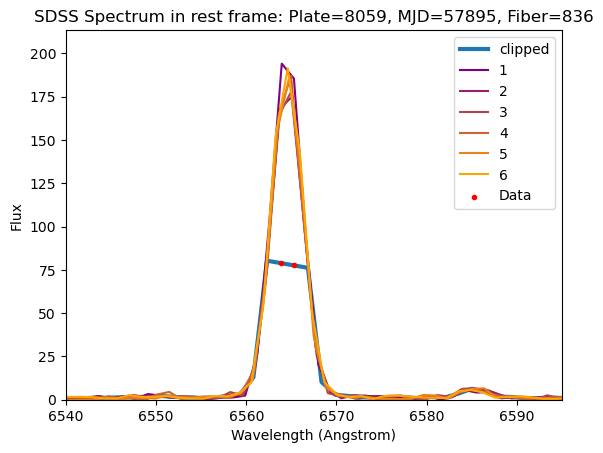

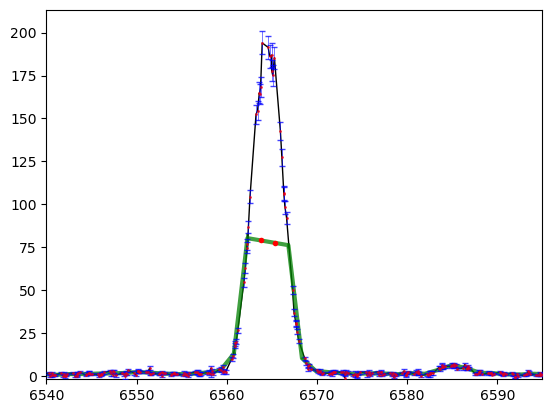

87
8213-58487-916


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


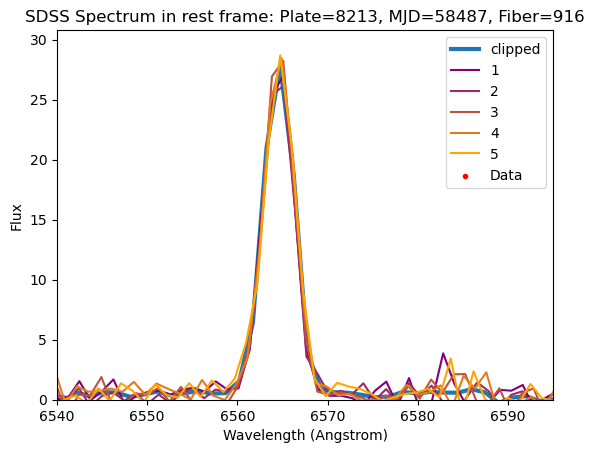

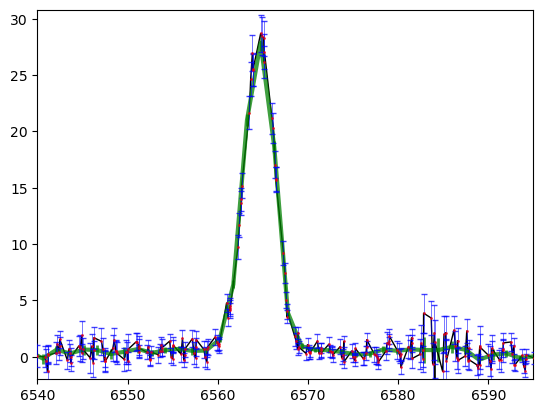

88
8221-58198-384


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


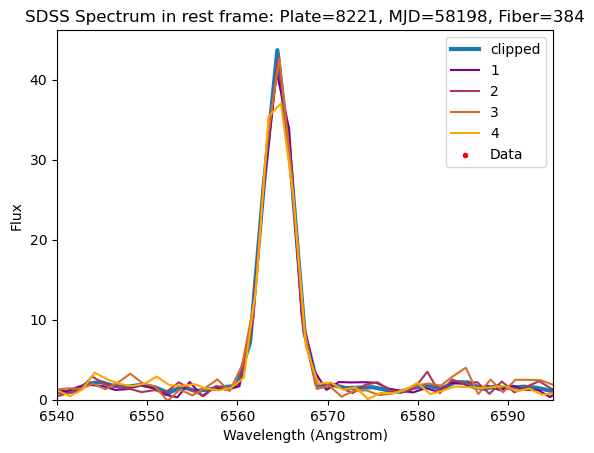

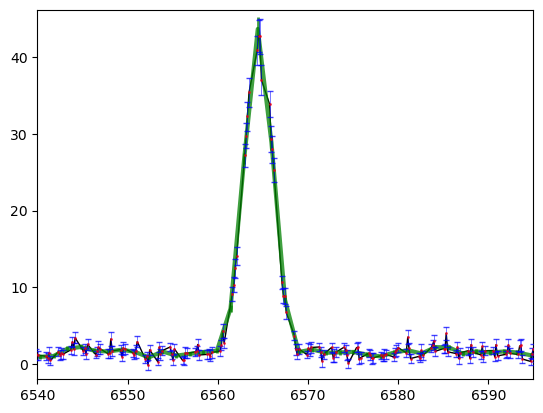

89
8236-58197-846


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


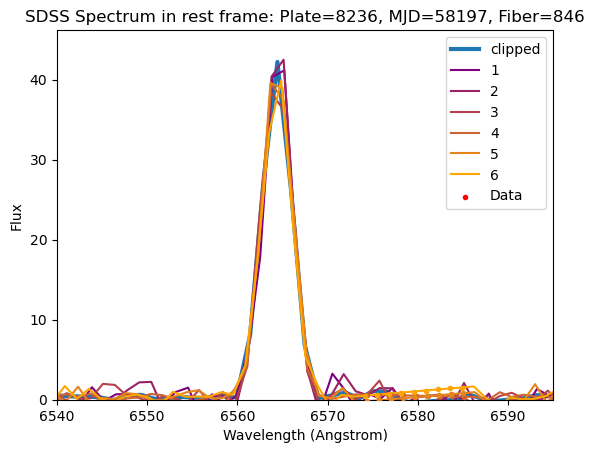

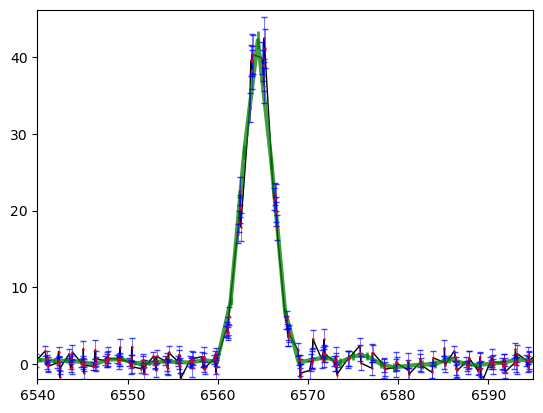

90
8236-58500-846


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


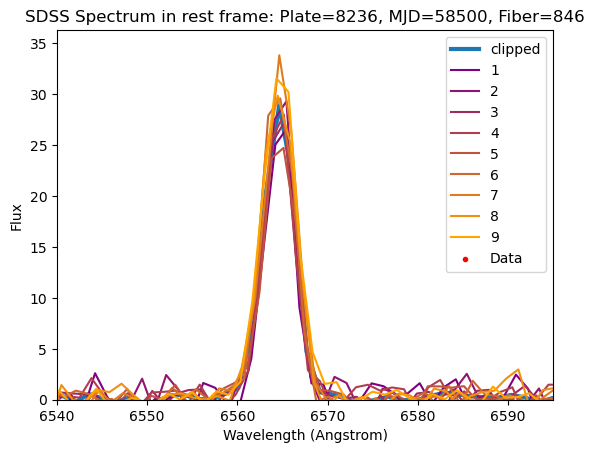

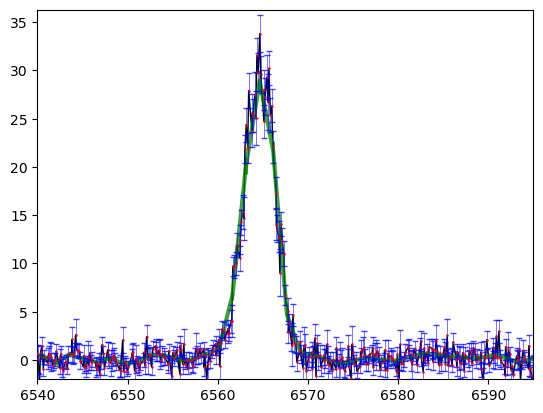

91
8396-57837-524


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


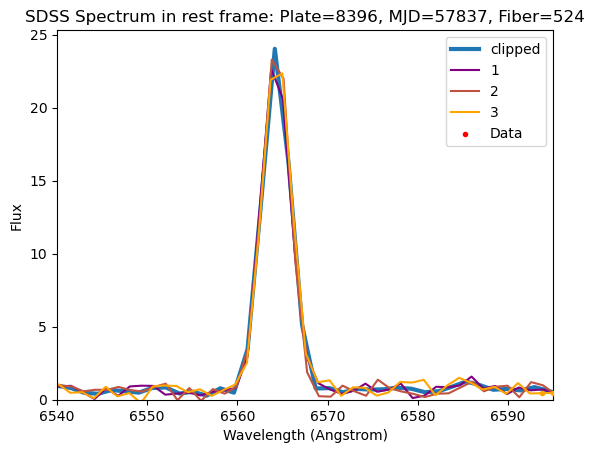

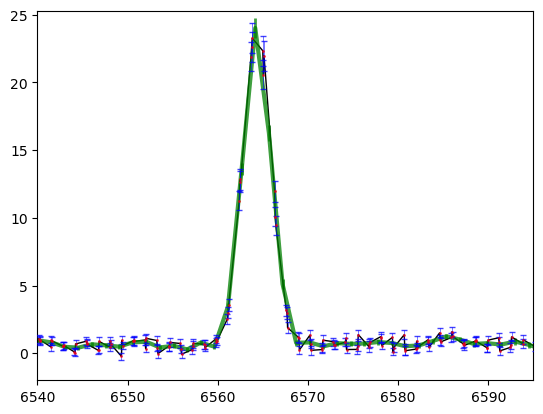

92
8845-58159-68


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


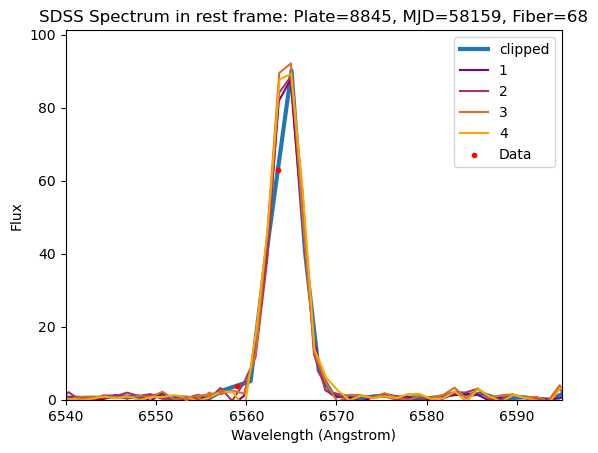

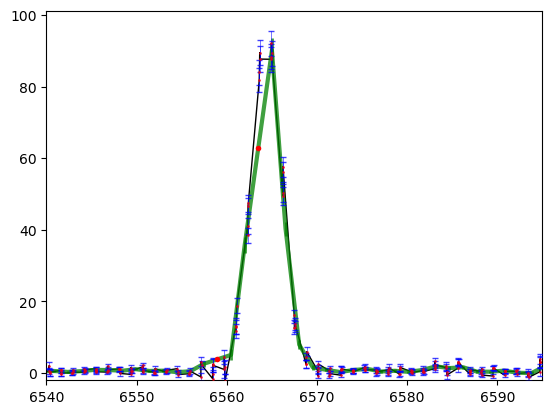

93
10261-58462-346


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


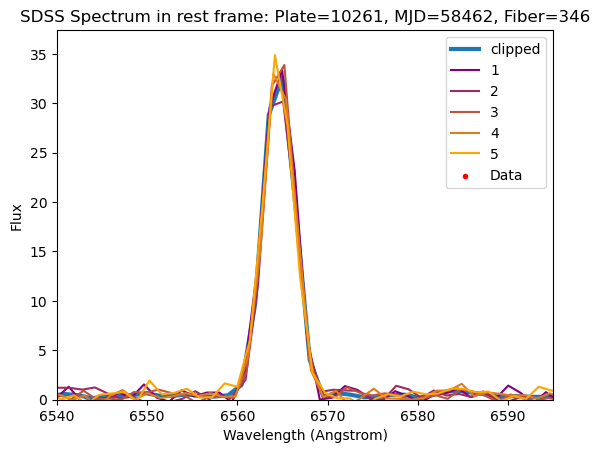

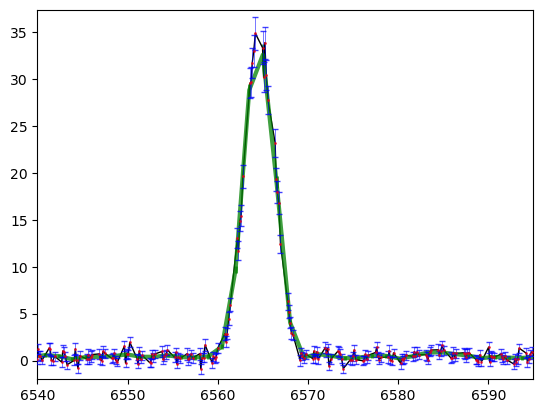

94
10664-58464-982


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


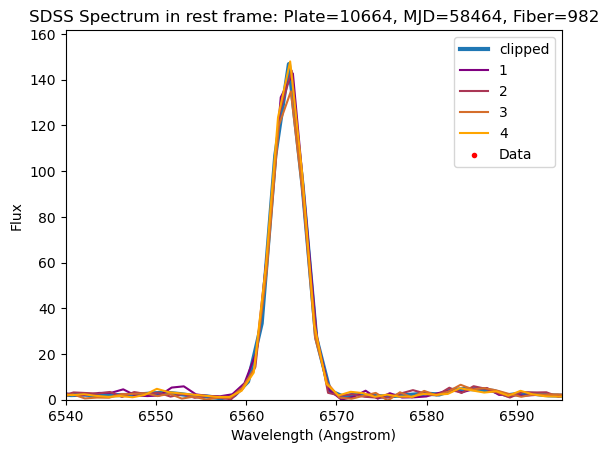

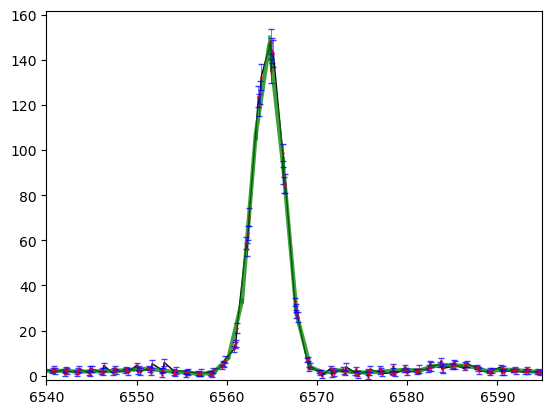

95
10724-58391-490


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


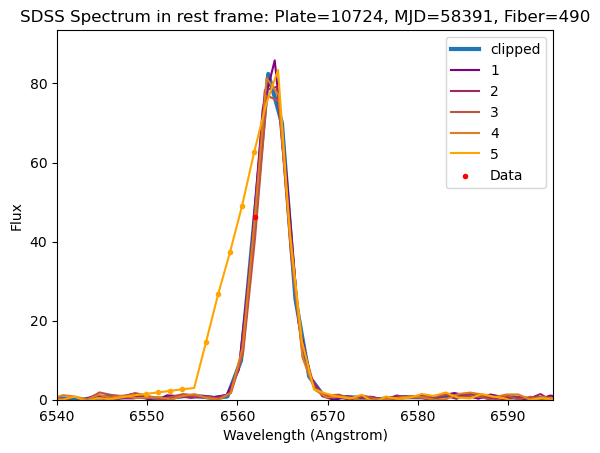

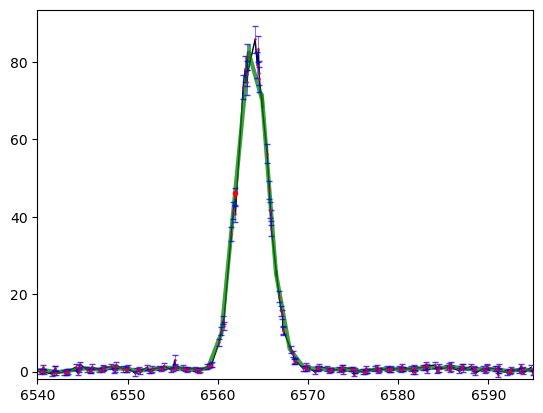

96
10742-58198-786


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


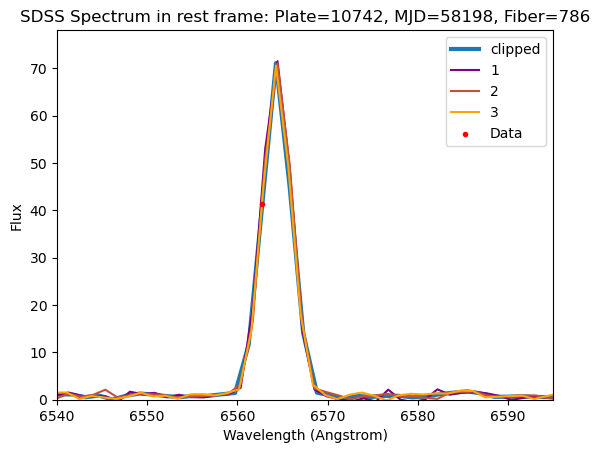

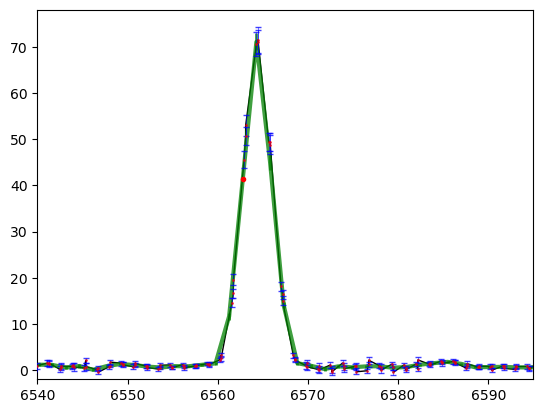

97
10756-58226-977


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


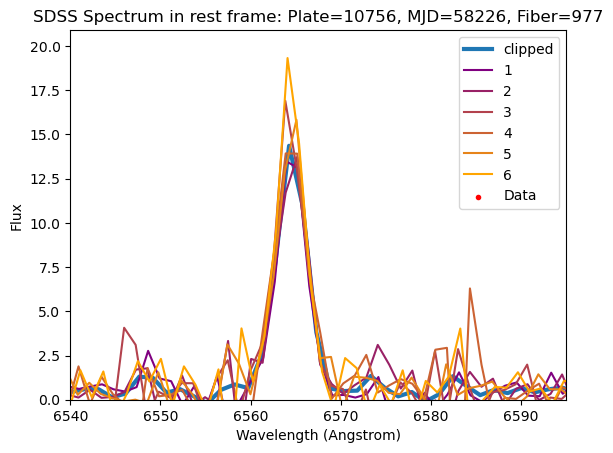

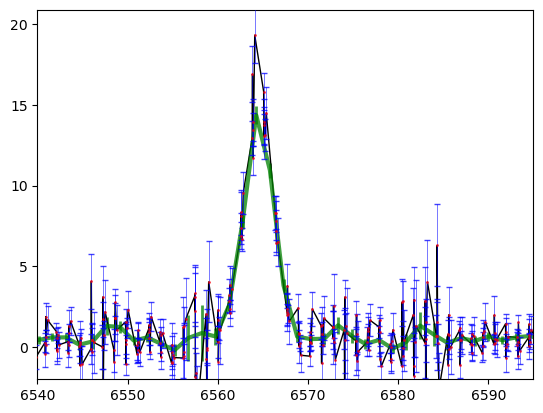

98
10911-58256-936


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


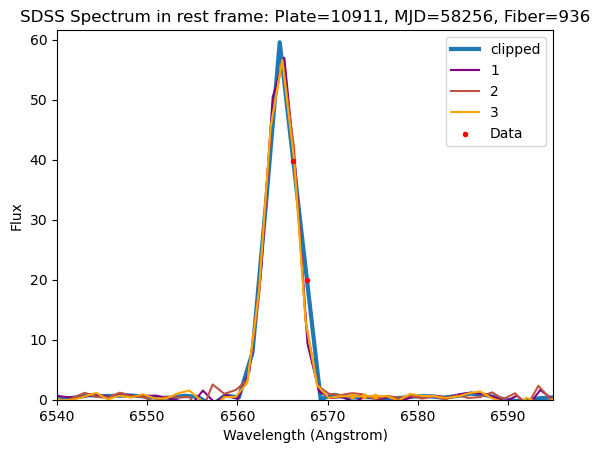

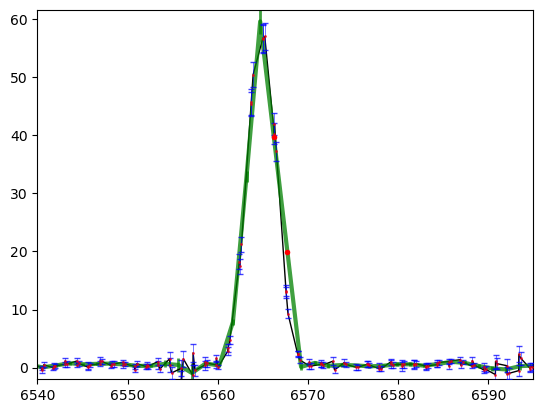

99
11112-58428-906


C:\Users\nihad\AppData\Local\Temp\ipykernel_13884\575735636.py:23: RuntimeWarning: divide by zero encountered in divide
  uncertainty = 1/np.sqrt(ivar)


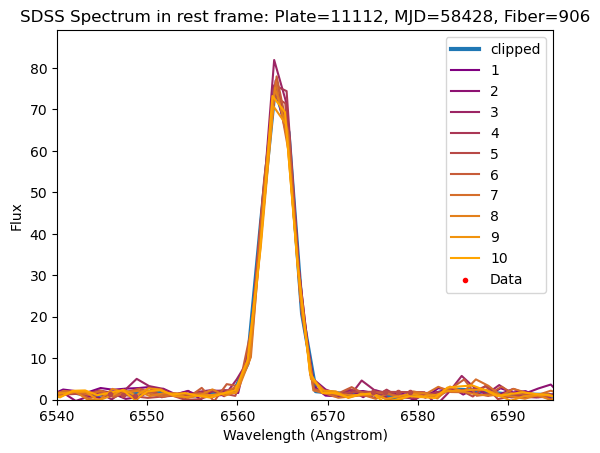

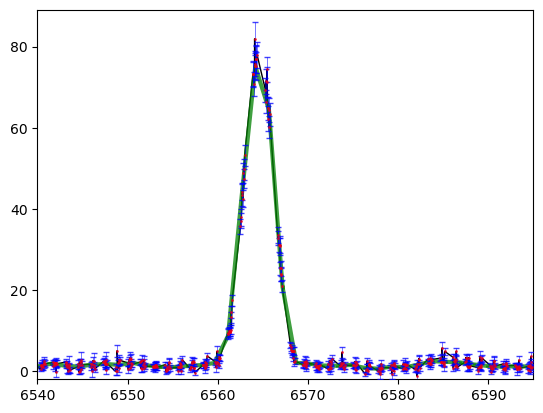

In [27]:
for i in range(100):
    print(i)
    num = random_galaxies[i]
    gal = cut_gals[num]

    plate = gal["PLATE"]
    mjd = gal["MJD"]
    fiber = gal["FIBER"]
    print(str(gal["PLATE"]) + "-" + str(gal["MJD"])+ "-"+ str(gal["FIBER"]))
    sp = SDSS.get_spectra(plate=plate, mjd=mjd, fiberID=fiber)
    if sp:
        spec_hdu = sp[0]
        spec_data = spec_hdu[1].data
    
        z = spec_hdu[2].data["z"]
    
        header = spec_hdu[0].header
    
        loglam = spec_data['loglam'].copy()
        flux = spec_data['flux'].copy()
        wavelength = 10**loglam/(1+z)
        ivar = spec_data['ivar'].copy()
        uncertainty = 1/np.sqrt(ivar)
    
        min = np.where(wavelength > 6540)[0][0]
        max = np.where(wavelength > 6595)[0][0]
    
        ivar0 = np.where(ivar == 0)[0]
        clipped = [item for item in ivar0 if ((item > min and item < max))]
    
        fig,ax = plt.subplots()
        ax.plot(wavelength, flux, lw=3, label="clipped")
        plt.xlabel("Wavelength (Angstrom)")
        plt.ylabel("Flux")
        plt.title(f"SDSS Spectrum in rest frame: Plate={plate}, MJD={mjd}, Fiber={fiber}")
    
        nexp = header['NEXP']
        grad = get_color_gradient("#800080","#FFA500", nexp//2)
        j = 1
        max_y_1 = []
        flux_sum_1 =[]
        wave_sum_1 = []
        ivar_sum_1 = []
        filter_1 = []
        for sub_exp in range(nexp//2):
            sub_data = spec_hdu[4+nexp//2+sub_exp].data
            sub_flux = sub_data['flux']
            sub_wavelength = 10**sub_data['loglam'] / (1+z)
            sub_ivar = sub_data['ivar']
            flux_sum_1.extend(sub_flux[sub_ivar>0])
            wave_sum_1.extend(sub_wavelength[sub_ivar>0])
            ivar_sum_1.extend(sub_ivar[sub_ivar>0])
            filter_1.extend([sub_exp for _ in range(len(sub_flux[sub_ivar>0]))])
            uncert_sub = [y if (x == 0) else -5 for x,y in zip(sub_ivar,sub_flux)]
            ax.plot(sub_wavelength, sub_flux, color = grad[sub_exp], lw=1.5, label=j)
            ax.scatter(sub_wavelength, uncert_sub, color = grad[sub_exp], linewidth=2, s = 4, zorder=3)
            min_sub = np.where(sub_wavelength > 6540)[0][0]
            max_sub = np.where(sub_wavelength > 6595)[0][0]
            max_y_1.append(sub_flux[min_sub:max_sub].max())
            j+=1
        ax.set_xlim(6540, 6595)
        ax.set_ylim(0, int(np.max(max_y_1))+int(np.max(max_y_1))/10)
        uncert = [y if (x == 0) else -5 for x,y in zip(ivar,flux)]
        plt.scatter(wavelength, uncert, color = "red", linewidth=2, s = 4, label='Data', zorder=3)
        plt.legend()
        plt.savefig(str(plate) + "-" + str(mjd)+ "-"+ str(fiber)+"correction_h_alpha.png")
        plt.show()
    
        combined = sorted(zip(wave_sum_1, flux_sum_1, ivar_sum_1,filter_1))

        # Unzip the sorted pairs back into separate lists
        sorted_wave_1, sorted_flux_1, sorted_ivar_1, sorted_filter_1 = zip(*combined)
        plt.errorbar(wavelength, flux, lw=3, yerr=uncertainty,label="clipped", color='green',markersize=1, markeredgecolor="red", alpha=0.75, elinewidth=2)
        plt.plot(sorted_wave_1, sorted_flux_1, linewidth=1, color='black')
        plt.errorbar(sorted_wave_1, sorted_flux_1, yerr=1/np.sqrt(sorted_ivar_1), fmt='o', color='blue',capsize=2, markersize=1, markeredgecolor="red", alpha=0.75, elinewidth=0.5, zorder=3)
        plt.scatter(wavelength, uncert, color = "red", linewidth=2, s = 4, label='Data', zorder=4)
        plt.xlim(6540, 6595)
        plt.ylim(-2, int(np.max(max_y_1))+int(np.max(max_y_1))/10)
        plt.savefig(str(plate) + "-" + str(mjd)+ "-"+ str(fiber)+"average_h_alpha.png")
        plt.show()

In [31]:
def merge_images(file1, file2):
    """Merge two images into one, displayed side by side
    :param file1: path to first image file
    :param file2: path to second image file
    :return: the merged Image object
    """
    image1 = Image.open(file1)
    image2 = Image.open(file2)
    (width1, height1) = image1.size
    (width2, height2) = image2.size

    result_height = height1 + height2
    result_width = width1

    result = Image.new('RGB', (result_width, result_height))
    result.paste(im=image1, box=(0, 0))
    result.paste(im=image2, box=(0, height1))
    return result

for i in range(100):
    num = random_galaxies[i]
    gal = cut_gals[num]

    plate = gal["PLATE"]
    mjd = gal["MJD"]
    fiber = gal["FIBER"]
    im1 = str(plate) + "-" + str(mjd)+ "-"+ str(fiber)+"correction_h_alpha.png"
    im2 = str(plate) + "-" + str(mjd)+ "-"+ str(fiber)+"average_h_alpha.png"
    merge = merge_images(im1, im2)
    merge.save(str(i)+".jpeg")

pdf = FPDF()
# imagelist is the list with all image filenames
for i in range(100):
    pdf.add_page()
    pdf.image(str(i)+".jpeg",w=pdf.epw,h=pdf.eph)
pdf.output("Clipped_h_alpha_analysis_w_average.pdf")

In [ ]:
#Tabulation of different problems with the data
#Figure out how to write it out as a fits file